<center><img src = "https://github.com/Trading-com-Dados/pmf/blob/main/logotipo-trading-com-dados.svg?raw=true" width = "200">

<center><img src = "https://github.com/Trading-com-Dados/pmf/blob/main/PMF%20002.png?raw=true" width = "700">

---
# **Estatística no Mercado Financeiro**
---

## **1. Introdução**

*Por que utilizar estatística?*

<img src="https://img.ifunny.co/images/d2e5651b80064003b248c3175ac092d94dd8dafe6b6375e441e1543c1e90ad7e_1.webp" width="500" align="left"/>

In [12]:
import numpy as np
from scipy import stats
import plotly.express as px

np.random.seed(13)
a = np.random.randint(50, size = 30)
b = np.random.randint(50, size = 30)
ab = zip(a,b)
fig = px.scatter(ab, x=a, y=b, template='simple_white', width=400, height=400)
fig.update_layout(paper_bgcolor="#f7f8fa", margin=dict(l=20, r=20, t=20, b=20))

**Considerando a complexidade do universo de dados do mercado financeiro...**

* Padronizar as interpretações

* Magnitude do relação/efeito

* Probabilidade de que o padrão se repita

In [173]:
corr, p = stats.pearsonr(a, b)
print('Correlação de Pearson, r=%.3f' %corr, 'p=%.3f' %p)

Correlação de Pearson, r=0.296 p=0.112


## **2. Bibliotecas**

In [174]:
!pip install yfinance
!pip install vectorbt
!pip install sweetviz
!pip install statsmodels
!pip install sweetviz
# Instale a versão abaixo do numpy para não dar erro ao importar o vectorbt
!pip install numpy==2.1 --upgrade
!pip install pingouin

<a id="importar">**Todas as Bibliotecas usadas neste módulo estão abaixo**</a>

In [191]:
import numpy as np
import pandas as pd
import os
import sweetviz as sv
from datetime import datetime, timedelta
import pytz

from scipy import stats
import pylab
from sklearn import linear_model
from sklearn.linear_model import LinearRegression
import statsmodels.api as sm
from statsmodels.stats.multicomp import pairwise_tukeyhsd
import pingouin as pg
from pingouin import mixed_anova, read_dataset

import yfinance as yf
import vectorbt as vbt

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
import plotly.figure_factory as ff
import plotly.express as px
from plotly.subplots import make_subplots


## **3. Análises exploratórias de dados: EDA**
### *Estatística descritiva*

O primeiro passo ao se analisar qualquer conjunto de dados, é entender como eles estão distribuídos.

Não é à toa que a primeira visualização que fizemos neste módulo foi um **scatter plot** (gráfico de dispersão)

> **Analyses** "<s>Men</s> of few words are the best <s>men</s>" **analyses**

> *Shakespeare*

### **3.1. Distribuição dos dados:**

#### *Medidas de posição e dispersão*

Distribuição dos dados é o ponto chave para praticamente tudo o que entendemos por estatística

Apesar disso, muitas vezes é simplesmente ignorada nos modelos. Muitas vezes, modelos podem não funcionar por causa de algumas poucas observações que distorcem a distribuição dos dados.

#### **3.1.1. Distribuição normal**

##### **Entendendo o comportamento**

Medidas paramétricas (média, desvios, intervalos de confiança, coeficiente de variação) funcionam bem

A distribuição normal (também chamada de Gaussiana), possui esse formato de 'sino'

A maioria dos fenômenos observados possuem distribuição normal

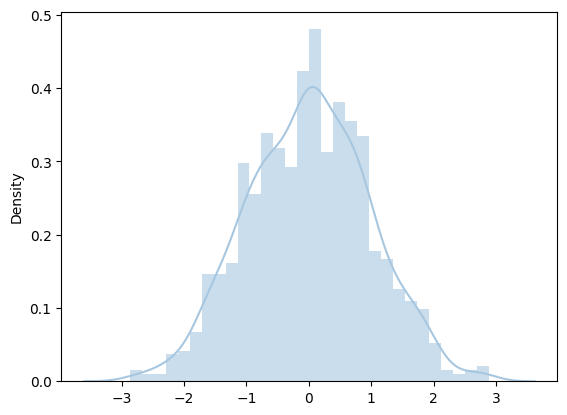

In [176]:
# Atualização: futuramente não estará disponível a função displot. 
# Abaixo segue uma alternativa para deixar semelhante.

normal_dist = np.random.normal(0, 1, 1000)
# Código anterior
# normal_fig01 = sns.distplot(normal_dist, hist=True, kde=True)

plt.hist(normal_dist, bins=30, density=True, alpha=0.6, color='#A7C7E0')  # Histograma
sns.kdeplot(normal_dist, color='#A7C7E0');

Uma das propriedades mais importantes da distribuição normal é que a média, mediana e moda serão iguais.

É difícil verificar uma distribuição que seja **exatamente** normal, portanto estes valores serão **próximos**.

##### **Medidas de posição: média, mediana e moda**

**Média:**

A média é a média aritmética de um conjunto de números.

**Mediana:**

A mediana é um valor numérico que separa a metade superior de um conjunto da metade inferior.

**Moda:**

Valor que acontece com mais frequência.

In [177]:
print(np.mean(normal_dist))
print(np.median(normal_dist))
print(stats.mode(normal_dist))

0.0017066272520296834
0.0239444097099838
ModeResult(mode=np.float64(-2.8662660210883883), count=np.int64(1))


In [178]:
print(round(np.mean(normal_dist), 2))
print(round(np.median(normal_dist), 2))

0.0
0.02


Vamos visualizar na plotly para gerar um gráfico dinâmico

In [179]:
fig01 = px.histogram(normal_dist, color_discrete_sequence=['lightseagreen'])
fig01.add_vline(x=np.mean(normal_dist), line_width=3,  line_color="red")
fig01.add_vline(x=np.median(normal_dist), line_width=3, line_dash="dash", line_color="red")
fig01.update_layout(width=400, height=400, template = 'simple_white',
                    paper_bgcolor="#f7f8fa", margin=dict(l=20, r=20, t=20, b=20),
                    showlegend=False)

**Como saber se uma distribuição é normal?**

Para isso, estudaremos os métodos a seguir.

##### **Testes de normalidade (caindo em desuso)**

In [180]:
teste_normalidade = stats.normaltest(normal_dist)
print(teste_normalidade)

NormaltestResult(statistic=np.float64(1.2987341250431184), pvalue=np.float64(0.5223763036889957))


À medida que aumenta o uso de grandes volumes de dados, os testes de normalidade vão caindo em desuso, pois eles são sensíveis justamente à quantidade de dados.

Para uma verificação da queda da normalidade com o volume de dados, acompanhe este breve teste que desenvolvemos:


https://colab.research.google.com/drive/1CVk9bKoV1Ld8WZpFYOkbsPDru1ZPQuPk?usp=sharing

##### **Medidas de posição: quantis**

Quantis são pontos de corte que dividem um intervalo de distribuição de probabilidade em intervalos contínuos com probabilidades iguais, ou as observações de uma amostra do mesmo jeito.

<img src="https://cdn.scribbr.com/wp-content/uploads/2022/05/Quartiles-probability-distribution.webp" width="500" align="left"/>

**Quantile-Quantile Plot (Q-Q plot)**

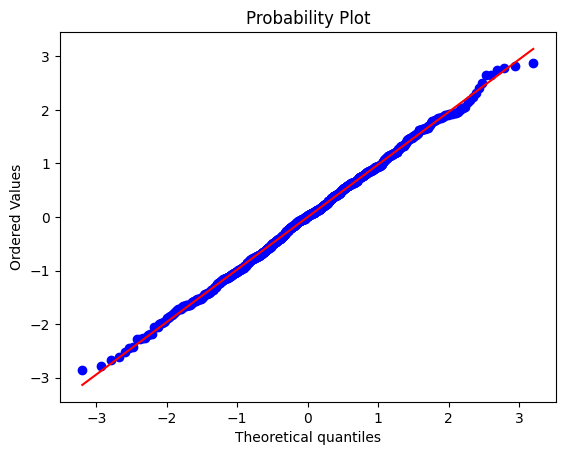

In [181]:
stats.probplot(normal_dist, dist="norm", plot=pylab)
pylab.show()

##### **Boxplots**

In [182]:
fig02 = go.Figure()
fig02.add_trace(go.Box(y=normal_dist, boxpoints='all', boxmean='sd', name='<b>Normal distribution', marker_color = 'blue'))
fig02.update_layout(width=400, height=400, template = 'simple_white',
                    paper_bgcolor="#f7f8fa", margin=dict(l=20, r=20, t=20, b=20),
                    showlegend=False)

In [183]:
print(np.quantile(normal_dist, 0.25))
print(np.percentile(normal_dist, 25))

-0.7102216215806376
-0.7102216215806376


In [184]:
df_normal_distrib = pd.DataFrame(normal_dist)
df_normal_distrib.describe()

,0
count,1000.000000
mean,0.001707
std,0.979604
min,-2.866266
25%,-0.710222
50%,0.023944
75%,0.651647
max,2.879035


##### **Assimetria (skewness)**


<img src="https://www.biologyforlife.com/uploads/2/2/3/9/22392738/c101b0da6ea1a0dab31f80d9963b0368_orig.png" width="800" align="left"/>

In [185]:
stats.skew(normal_dist)

np.float64(0.013535659786954618)

##### **Medidas de dispersão (amplitude, desvios padrão e médio, coeficiente de variação e intervalo de confiança)**

<img src="https://miro.medium.com/v2/resize:fit:1400/0*Wznts3xAm8Cqs-mW.png" width="500" align="left"/>


In [186]:
# Amplitude para alvos/stops

amplitude = normal_dist.max() - normal_dist.min()
amplitude

np.float64(5.74530113288316)

Desvio padrão


O desvio padrão é uma medida que indica a dispersão dos dados dentro de uma amostra com relação à média. Assim, quando se calcula o desvio padrão juntamente com a média de diferentes grupos, obtém-se mais informações para avaliar e diferenciar seus comportamentos.


Fonte: https://statplace.com.br/blog/desvio-padrao-e-erro-padrao/

In [187]:
# Desvio padrão da amostra (população degrees of freedom = False)
# Sharpe ratio, bandas de bollinger

desvio_padrao = np.std(normal_dist, ddof = True)
desvio_padrao

np.float64(0.9796038897827954)

In [188]:
# Coeficiente de variação
# Interessante para comparações e avaliar a consistência (ex., pagamento de dividendos)

normal_dist.std(ddof = True)/normal_dist.mean()*100

np.float64(57399.99104184921)

In [189]:
# Erro padrão da média

# Futuramente ficará obsoleto esse caminho para usar o método 'sem'
# stats.stats.sem(normal_dist) 

# Atualizado
stats.sem(normal_dist)

np.float64(0.030977794964741814)

In [190]:
# Intervalo de confiança 95%
# Probabilidade de 95% da média real estar nesse intervalo

IC_95 = stats.t.interval(confidence=0.95, df=len(normal_dist)-1, loc=np.mean(normal_dist), scale=stats.sem(normal_dist))
IC_95

(np.float64(-0.05908238418177415), np.float64(0.06249563868583352))

##### **Curtose (kurtosis)**

<img src="https://www.researchgate.net/profile/Attila-Bonyar/publication/298415862/figure/fig1/AS:340236723867648@1458130164255/Illustration-of-the-skewness-and-kurtosis-values-and-how-they-correlate-with-the-shape-of_W640.jpg" width="600" align="left"/>

In [191]:
stats.kurtosis(normal_dist, fisher=True)

np.float64(-0.17380483378203193)

#### **3.1.2. Checando as medidas de posição e dispersão no dados do MF**

Vamos verificar na prática como essas métricas se comportam em dados reais

Estudos de caso:

1. Preços MGLU3

2. Preço e retornos IBOV

3. Dividendos em PETR4

4. Arbitragem em ações

##### **Preços MGLU3**

Extração pode ser feita de duas maneiras

1. Através da yfinance

In [192]:
# auto_adjust=False -> para trazer a coluna 'Adj Close', caso contrário o preço ajustado será aplicado nas colunas OHCL
# multi_level_index=False -> para trazer apenas um index
mglu3_close = yf.download('MGLU3.SA', period = 'max', auto_adjust=False, multi_level_index=False)['Adj Close']

[*********************100%***********************]  1 of 1 completed


2. Através do arquivo .csv

In [193]:
# Os arquivos se encontram na pasta 'Meus Arquivos'. Vou usar boas práticas para acessá-los.

folder_name = "Meus Arquivos"
file_name = 'MGLU3.csv'
# Pegando o caminho atual do jupyter
base_path = os.getcwd()
# Caminho completo do arquivo
file_path = os.path.join(base_path, folder_name, file_name)

mglu3_close = pd.read_csv(file_path, index_col = 0)

In [194]:
mglu3_close.index

Index(['2011-05-02 00:00:00-03:00', '2011-05-03 00:00:00-03:00',
       '2011-05-04 00:00:00-03:00', '2011-05-05 00:00:00-03:00',
       '2011-05-06 00:00:00-03:00', '2011-05-09 00:00:00-03:00',
       '2011-05-10 00:00:00-03:00', '2011-05-11 00:00:00-03:00',
       '2011-05-12 00:00:00-03:00', '2011-05-13 00:00:00-03:00',
       ...
       '2023-01-20 00:00:00-03:00', '2023-01-23 00:00:00-03:00',
       '2023-01-24 00:00:00-03:00', '2023-01-25 00:00:00-03:00',
       '2023-01-26 00:00:00-03:00', '2023-01-27 00:00:00-03:00',
       '2023-01-30 00:00:00-03:00', '2023-01-31 00:00:00-03:00',
       '2023-02-01 00:00:00-03:00', '2023-02-02 00:00:00-03:00'],
      dtype='object', name='Date', length=2922)

In [195]:
mglu3_close.index = pd.to_datetime(mglu3_close.index, utc = True)

In [196]:
mglu3_close.index

DatetimeIndex(['2011-05-02 03:00:00+00:00', '2011-05-03 03:00:00+00:00',
               '2011-05-04 03:00:00+00:00', '2011-05-05 03:00:00+00:00',
               '2011-05-06 03:00:00+00:00', '2011-05-09 03:00:00+00:00',
               '2011-05-10 03:00:00+00:00', '2011-05-11 03:00:00+00:00',
               '2011-05-12 03:00:00+00:00', '2011-05-13 03:00:00+00:00',
               ...
               '2023-01-20 03:00:00+00:00', '2023-01-23 03:00:00+00:00',
               '2023-01-24 03:00:00+00:00', '2023-01-25 03:00:00+00:00',
               '2023-01-26 03:00:00+00:00', '2023-01-27 03:00:00+00:00',
               '2023-01-30 03:00:00+00:00', '2023-01-31 03:00:00+00:00',
               '2023-02-01 03:00:00+00:00', '2023-02-02 03:00:00+00:00'],
              dtype='datetime64[ns, UTC]', name='Date', length=2922, freq=None)

In [197]:
mglu3_close.head()

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2011-05-02 03:00:00+00:00,0.503125,0.518750,0.503125,0.514062,0.463173,280003200
2011-05-03 03:00:00+00:00,0.515625,0.521562,0.506250,0.509375,0.458950,33670400
2011-05-04 03:00:00+00:00,0.510000,0.515000,0.510000,0.515000,0.464018,39203200
2011-05-05 03:00:00+00:00,0.512812,0.512812,0.510000,0.511875,0.461202,35097600
2011-05-06 03:00:00+00:00,0.510937,0.511875,0.500000,0.508125,0.457824,38672000


In [198]:
mglu3_close = mglu3_close['Adj Close']

Vamos fazer um histograma com os dados de fechamento diário de MGLU3

In [199]:
go.Histogram(x=mglu3_close)

Histogram({
    'x': array([0.46317288, 0.45894977, 0.46401796, ..., 4.42999983, 4.28999996,
          4.34000015])
})

In [200]:
fig01 = make_subplots(rows = 1, cols = 2)

fig01.add_trace(go.Histogram(x=mglu3_close),row=1,col=1)
fig01.add_vline(x=np.mean(mglu3_close), line_width=3,  line_color="red", row=1,col=1)
fig01.add_vline(x=np.median(mglu3_close), line_width=3, line_dash="dash", line_color="red",row=1,col=1)


fig01.add_trace(go.Box(y=mglu3_close, boxpoints='all', boxmean='sd'),row=1,col=2)

fig01.update_layout(width=800, height=400, template = 'simple_white',
                    paper_bgcolor="#f7f8fa", margin=dict(l=20, r=20, t=20, b=20),
                    showlegend=True)



O preço não possui uma distribuição normal. Verifique acima em quais zonas o preço se concentrou ao longo do tempo.

##### **Preço e retornos IBOV**

Duas formas de extrair os dados.

In [201]:
ibov = yf.download('^BVSP', start = '2000-01-1', multi_level_index=False)['Close']

[*********************100%***********************]  1 of 1 completed


Se a biblioteca yfinance não estiver funcionando, utilize o CSV

In [202]:
folder_name = "Meus Arquivos"
file_name = 'dados_ibov.csv'
# Pegando o caminho atual do jupyter
base_path = os.getcwd()
# Caminho completo do arquivo
file_path = os.path.join(base_path, folder_name, file_name)

ibov = pd.read_csv(file_path, index_col= 0 )

In [203]:
ibov.index = pd.to_datetime(ibov.index, utc = True)

In [204]:
ibov = ibov['Close']

In [205]:
ibov.head()

Date
2000-01-03 02:00:00+00:00    16930.0
2000-01-04 02:00:00+00:00    15851.0
2000-01-05 02:00:00+00:00    16245.0
2000-01-06 02:00:00+00:00    16107.0
2000-01-07 02:00:00+00:00    16309.0
Name: Close, dtype: float64

In [206]:
fig02 = px.histogram(ibov, color_discrete_sequence=['lightseagreen'])

fig02.add_vline(x=np.mean(ibov), line_width=3,  line_color="red")
fig02.add_vline(x=np.median(ibov), line_width=3, line_dash="dash", line_color="red")

fig02.update_layout(width=400, height=400, template = 'simple_white',
                    paper_bgcolor="#f7f8fa", margin=dict(l=20, r=20, t=20, b=20),
                    showlegend=False)

Distribuição trimodal, com três picos.

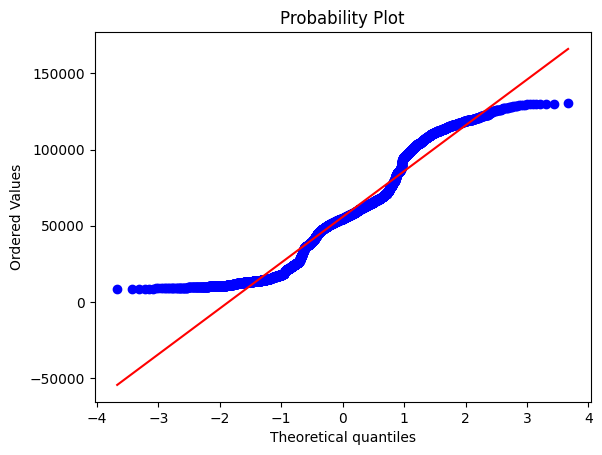

In [207]:
stats.probplot(ibov, dist="norm", plot=pylab)
pylab.show()

O resultado mostra que estamos muito longe de ter uma distribuição normal.

Veja a diferença quando modelamos os dados de retornos.

In [208]:
retornos_ibov = ibov.pct_change()

In [209]:
retornos_ibov.dropna(inplace = True)

In [210]:
np.mean(retornos_ibov)

np.float64(0.00048497344865041156)

In [211]:
fig03 = px.histogram(retornos_ibov, color_discrete_sequence=['lightseagreen'])

fig03.add_vline(x=np.mean(retornos_ibov), line_width=3,  line_color="red")
fig03.add_vline(x=np.median(retornos_ibov), line_width=3, line_dash="dash", line_color="red")

fig03.update_layout(width=400, height=400, template = 'simple_white',
                    paper_bgcolor="#f7f8fa", margin=dict(l=20, r=20, t=20, b=20),
                    showlegend=False)

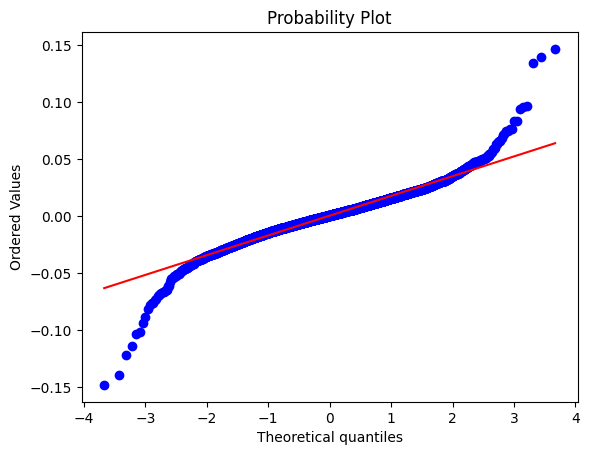

In [212]:
stats.probplot(retornos_ibov, dist="norm", plot=pylab)
pylab.show()

Assimetria e curtose

In [213]:
stats.skew(retornos_ibov)

np.float64(-0.124395830846772)

In [214]:
stats.kurtosis(retornos_ibov, fisher=True)

np.float64(6.1721580214715175)

Assimetria negativa - temos retornos diários normalmente maiores.

##### **Dividendos em PETR4**

In [215]:
# Pegando o caminho atual do jupyter
base_path = os.getcwd()
# Caminho completo do arquivo. Aconselhável usar o join para não dar problema com '\' ou '/', separador de caminho
file_path = os.path.join(base_path, "Meus Arquivos", 'dados_ibov.csv')


dividendos_petro = pd.read_csv(file_path)

In [216]:
dividendos_petro.head()

,Date,Open,High,Low,Close,Adj Close,Volume
0,2000-01-03 00:00:00-02:00,17098.0,17408.0,16719.0,16930.0,16930.0,0
1,2000-01-04 00:00:00-02:00,16908.0,16908.0,15851.0,15851.0,15851.0,0
2,2000-01-05 00:00:00-02:00,15871.0,16302.0,15350.0,16245.0,16245.0,0
3,2000-01-06 00:00:00-02:00,16237.0,16499.0,15977.0,16107.0,16107.0,0
4,2000-01-07 00:00:00-02:00,16125.0,16449.0,16125.0,16309.0,16309.0,0


In [217]:
dividendos_petr4 = vbt.YFData.download('PETR4.SA').get(['Close', 'Dividends'])

In [218]:
dividendos_petr4.head()

,Close,Dividends
Date,,
2000-01-03 02:00:00+00:00,1.283073,0.0
2000-01-04 02:00:00+00:00,1.212095,0.0
2000-01-05 02:00:00+00:00,1.199864,0.0
2000-01-06 02:00:00+00:00,1.195715,0.0
2000-01-07 02:00:00+00:00,1.201175,0.0


Calculando o Dividend Yield

Se você não sabe o que são Dividendos ou Dividend Yield, não se preocupe! Esse assunto será abordado no detalhe no módulo de análise fundamentalista.

A intenção aqui é utilizar esta métrica apenas para análise estatística, e não entrar no detalhe dos aspectos de mercado financeiro em si.

In [219]:
# Código anterior:
# dividendos_petr4['soma_dividendos'] = dividendos_petr4.Dividends.rolling('365D').sum()

# Para evitar erros ao trabalhar com a alteração de um pedaço do dataframe a melhor prática é usar '.loc' 
# porque daixa explícito que deseja alterar o dataframe original. Até para evitar warnings
# Código atualizado:
dividendos_petr4.loc[:, 'soma_dividendos'] = dividendos_petr4['Dividends'].rolling('365D').sum()

C:\Users\bague\AppData\Local\Temp\ipykernel_16532\1040819576.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [220]:
dividendos_petr4.tail()

,Close,Dividends,soma_dividendos
Date,,,
2025-01-21 03:00:00+00:00,37.299999,0.0,7.902438
2025-01-22 03:00:00+00:00,37.090000,0.0,7.902438
2025-01-23 03:00:00+00:00,36.830002,0.0,7.902438
2025-01-24 03:00:00+00:00,36.639999,0.0,7.902438
2025-01-28 03:00:00+00:00,37.310001,0.0,7.902438


<Axes: xlabel='Date'>

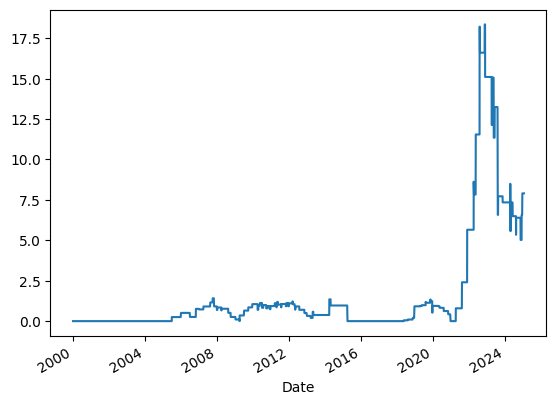

In [221]:
dividendos_petr4.soma_dividendos.plot()

In [222]:
dividendos_petr4['DY'] = dividendos_petr4['soma_dividendos']/dividendos_petr4.Close * 100

Para evitar grandes distorções, vamos remover os dias onde não houve pagamentos de dividendos

In [223]:
dy_petr4 = dividendos_petr4[dividendos_petr4['Dividends']!=0]

<Axes: xlabel='Date'>

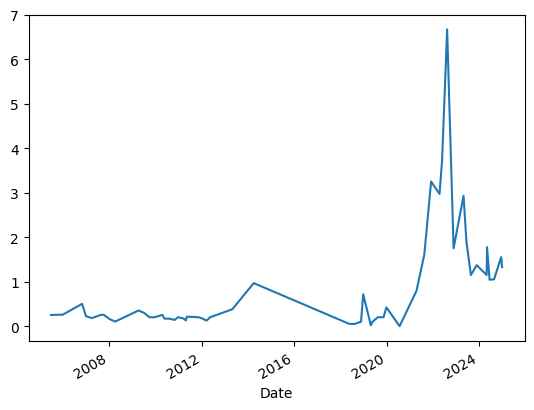

In [224]:
dy_petr4.Dividends.plot()

<Axes: xlabel='Date'>

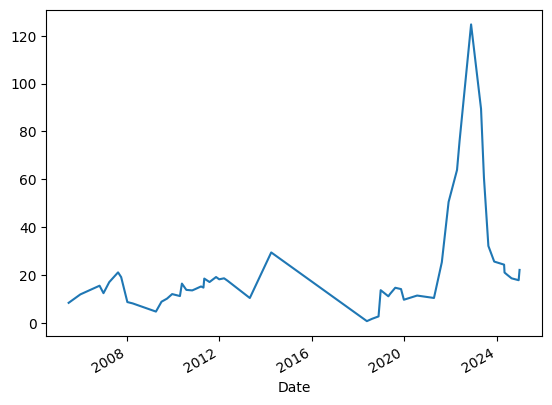

In [225]:
dy_petr4.DY.plot()

In [226]:
np.mean(dy_petr4.DY)

np.float64(23.20053029146571)

In [227]:
np.median(dy_petr4.DY)

np.float64(15.491368209813075)

<Axes: xlabel='DY', ylabel='Density'>

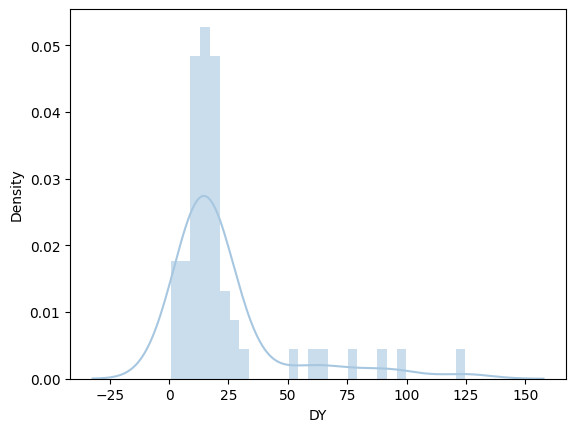

In [228]:
# Código anterior
# sns.distplot(dy_petr4.DY, hist=True, kde=True)

# Atualização: futuramente não estará disponível a função displot. 
# Abaixo segue uma alternativa para deixar semelhante.

plt.hist(dy_petr4.DY, bins=30, density=True, alpha=0.6, color='#A7C7E0')  # Histograma
sns.kdeplot(dy_petr4.DY, color='#A7C7E0')

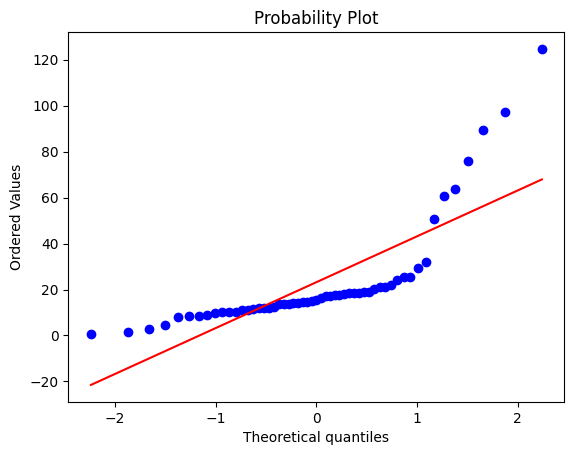

In [229]:
stats.probplot(dy_petr4.DY, dist="norm", plot=pylab)
pylab.show()

Dividend Yield de PETR4 foi maior nos períodos onde o preço da ação estava maior?

In [230]:
fig04 = px.scatter(x=dy_petr4.Close, y=dy_petr4.DY, width=500)

fig04.update_layout(width=500, height=500, template = 'simple_white',
                    paper_bgcolor="#f7f8fa", margin=dict(l=20, r=20, t=20, b=20),
                    showlegend=False, xaxis_title='<b>Preço PETR4 (R$)', yaxis_title='<b>DY PETR4 (%)')

fig04.show()

Testes de correlação

Correlação de Pearson

In [231]:
corr, p = stats.pearsonr(dy_petr4.Close, dy_petr4.DY)
print('Correlação de Pearson, r=%.3f' %corr, 'p=%.3f' %p)

Correlação de Pearson, r=0.268 p=0.048


Correlação de Spearman

Correlação de Spearman é não-paramétrica e não assume distribuição normal

In [232]:
corr, p = stats.spearmanr(dy_petr4.Close, dy_petr4.DY)
print('Correlação de Spearman, r=%.3f' %corr, 'p=%.3f' %p)

Correlação de Spearman, r=0.370 p=0.005


##### **Arbitragem em ações**

In [233]:
# Pegando o caminho atual do jupyter
base_path = os.getcwd()
# Caminho completo do arquivo. Aconselhável usar o join para não dar problema com '\' ou '/', separador de caminho
file_path = os.path.join(base_path, "Meus Arquivos", 'spread_petro.csv')

spread = pd.read_csv(file_path, index_col = 0)

In [234]:
spread.head()

,PETR3.SA,PETR4.SA
Date,,
2010-01-04 00:00:00-02:00,17.247704,13.817431
2010-01-05 00:00:00-02:00,17.144175,13.698956
2010-01-06 00:00:00-02:00,17.313967,13.884079
2010-01-07 00:00:00-02:00,17.210434,13.754492
2010-01-08 00:00:00-02:00,17.082066,13.680444


In [235]:
spread.index = pd.to_datetime(spread.index, utc = True)

In [236]:
spread["ratio"] = round(spread['PETR4.SA']/spread['PETR3.SA'], 3)

In [237]:
spread.head()

,PETR3.SA,PETR4.SA,ratio
Date,,,
2010-01-04 02:00:00+00:00,17.247704,13.817431,0.801
2010-01-05 02:00:00+00:00,17.144175,13.698956,0.799
2010-01-06 02:00:00+00:00,17.313967,13.884079,0.802
2010-01-07 02:00:00+00:00,17.210434,13.754492,0.799
2010-01-08 02:00:00+00:00,17.082066,13.680444,0.801


<Axes: xlabel='Date'>

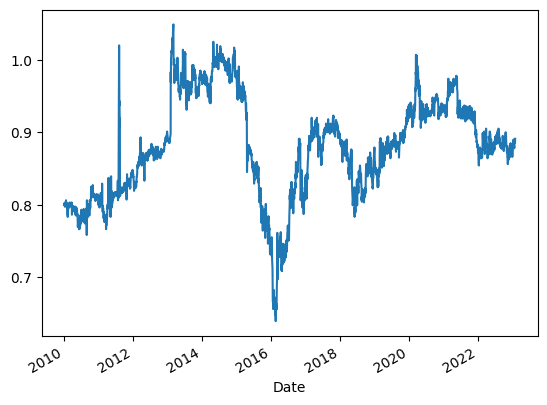

In [238]:
spread.ratio.plot()

In [239]:
media_spread = round(np.mean(spread.ratio),3)
sd1_min_spread = media_spread - round(np.std(spread.ratio),3)
sd1_max_spread = media_spread + round(np.std(spread.ratio),3)
sd2_min_spread = media_spread - (2* (round(np.std(spread.ratio),3)))
sd2_max_spread = media_spread + (2* (round(np.std(spread.ratio),3)))

In [240]:
fig = px.line(spread, x=spread.index, y=spread.ratio)

fig.add_hline(y=media_spread, line_width=5, line_color="green")
fig.add_hline(y=sd1_min_spread, line_width=3, line_dash="dash", line_color="orange")
fig.add_hline(y=sd1_max_spread, line_width=3, line_dash="dash", line_color="orange")
fig.add_hline(y=sd2_min_spread, line_width=5, line_dash="dash", line_color="red")
fig.add_hline(y=sd2_max_spread, line_width=5, line_dash="dash", line_color="red")

fig.update_layout(xaxis_rangeslider_visible=False, title_text='Razão entre preço PETR4 e PETR3 (2010 e mar/2022)',
                  paper_bgcolor="#f7f8fa", margin=dict(l=20, r=20, t=70, b=20),
                  template = 'simple_white',width=500,height=500)
fig.show()

Repare que medimos as distâncias com o desvio-padrão

##### **Métricas móveis (médias móveis)**

In [241]:
spread.head()

,PETR3.SA,PETR4.SA,ratio
Date,,,
2010-01-04 02:00:00+00:00,17.247704,13.817431,0.801
2010-01-05 02:00:00+00:00,17.144175,13.698956,0.799
2010-01-06 02:00:00+00:00,17.313967,13.884079,0.802
2010-01-07 02:00:00+00:00,17.210434,13.754492,0.799
2010-01-08 02:00:00+00:00,17.082066,13.680444,0.801


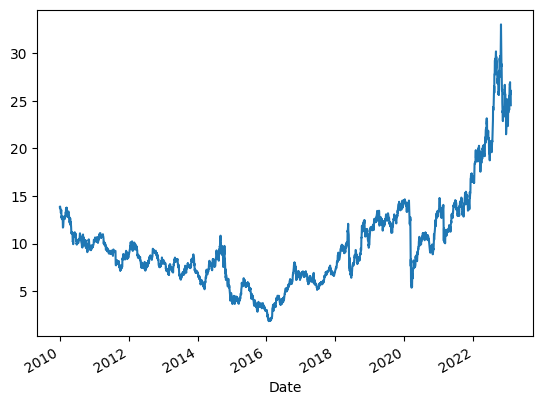

In [242]:
spread['PETR4.SA'].plot();

In [243]:
spread['MM_20'] = spread['PETR4.SA'].rolling(20).mean()

In [244]:
spread.head(20)

,PETR3.SA,PETR4.SA,ratio,MM_20
Date,,,,
2010-01-04 02:00:00+00:00,17.247704,13.817431,0.801,NaN
2010-01-05 02:00:00+00:00,17.144175,13.698956,0.799,NaN
2010-01-06 02:00:00+00:00,17.313967,13.884079,0.802,NaN
2010-01-07 02:00:00+00:00,17.210434,13.754492,0.799,NaN
2010-01-08 02:00:00+00:00,17.082066,13.680444,0.801,NaN
2010-01-11 02:00:00+00:00,17.098629,13.636019,0.797,NaN
2010-01-12 02:00:00+00:00,16.883289,13.462003,0.797,NaN
2010-01-13 02:00:00+00:00,16.730070,13.439786,0.803,NaN
2010-01-14 02:00:00+00:00,16.460896,13.206534,0.802,NaN


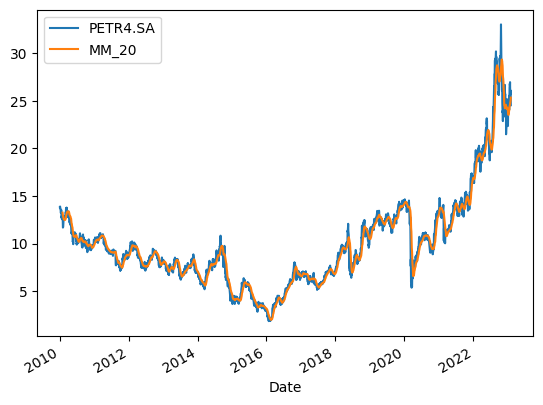

In [245]:
spread[['PETR4.SA', 'MM_20']].plot();

In [246]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=spread.index, y=spread["PETR4.SA"], name = 'Cotação de PETR4'))
fig.add_trace(go.Scatter(x=spread.index, y=spread["MM_20"], name = 'Média Móvel de 20 períodos'))

fig.update_layout(xaxis_rangeslider_visible=False, margin=dict(l=120, r=20, t=20, b=20),
                  template = 'simple_white',
                  paper_bgcolor="#f7f8fa", width=800,height=400)

fig.show()

**Z Score**

<img src="https://amsi.org.au/ESA_Senior_Years/imageSenior/4h_29.png" width="400" align="left"/>

<img src="https://i0.wp.com/statisticsbyjim.com/wp-content/uploads/2022/01/z-table_graph_ex.png?resize=300%2C196&ssl=1" width="400" align="left"/>

A tabela Z, também conhecida como tabela normal padrão, fornece a área abaixo da curva à esquerda do Z-score. A área representa a probabilidade que os valores de Z cairão dentro de uma região da distribuição normal padrão.

Referências

Para saber mais

https://amsi.org.au/ESA_Senior_Years/SeniorTopic4/4h/4h_2content_11.html

In [247]:
spread['IC_95_mm_lower'] = spread['PETR4.SA'].rolling(window=20).mean() - 1.96*spread['PETR4.SA'].rolling(window=20).std()
spread['IC_95_mm_upper'] = spread['PETR4.SA'].rolling(window=20).mean() + 1.96*spread['PETR4.SA'].rolling(window=20).std()

In [248]:
spread.head()

,PETR3.SA,PETR4.SA,ratio,MM_20,IC_95_mm_lower,IC_95_mm_upper
Date,,,,,,
2010-01-04 02:00:00+00:00,17.247704,13.817431,0.801,NaN,NaN,NaN
2010-01-05 02:00:00+00:00,17.144175,13.698956,0.799,NaN,NaN,NaN
2010-01-06 02:00:00+00:00,17.313967,13.884079,0.802,NaN,NaN,NaN
2010-01-07 02:00:00+00:00,17.210434,13.754492,0.799,NaN,NaN,NaN
2010-01-08 02:00:00+00:00,17.082066,13.680444,0.801,NaN,NaN,NaN


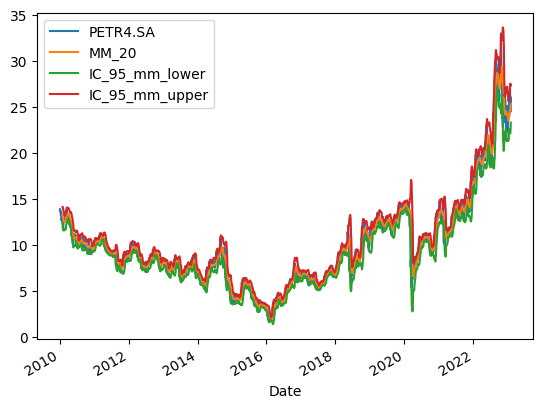

In [249]:
spread[['PETR4.SA','MM_20','IC_95_mm_lower','IC_95_mm_upper']].plot();

In [11]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=spread.index, y=spread["PETR4.SA"], name = 'Cotação de PETR4'))
fig.add_trace(go.Scatter(x=spread.index, y=spread["MM_20"], name = 'Média Móvel de 20 períodos'))
fig.add_trace(go.Scatter(x=spread.index, y=spread["IC_95_mm_lower"], name = 'Banda Inferior'))
fig.add_trace(go.Scatter(x=spread.index, y=spread["IC_95_mm_upper"], name = 'Banda Superior'))

fig.update_layout(xaxis_rangeslider_visible=False, margin=dict(l=120, r=20, t=20, b=20),
                  template = 'simple_white',
                  paper_bgcolor="#f7f8fa", width=800,height=400)

fig.show()

NameError: name 'spread' is not defined

#### **3.1.3. Outras distribuições importantes**

##### **Distribuição de Poisson**

Incluir a distribuição correta pode aumentar muito a acurácia dos modelos

Atenção especial à variável resposta: é contínua ou discreta?

<img src="https://programmathically.com/wp-content/uploads/2021/02/poisson-distribution.png" width="400" align="left"/>

##### **Log Normal**

<img src="https://docs.analytica.com/images/d/d9/LogNormal%28median%3D3%2Cstddev%3D2%29.png" width="400" align="left"/>

<img src="https://www.investopedia.com/thmb/svzNVsBQGD8MgoKYSmVBMIhL84g=/750x0/filters:no_upscale():max_bytes(150000):strip_icc():format(webp)/LognormalandNormalDistribution2_2-5dd2dde6dd3243cbbc1b6d995db3f0d6.png" width="400" align="left"/>

##### **Logística (binomial)**


<img src="https://www.researchgate.net/profile/Srirama-Bhamidipati/publication/253142460/figure/fig9/AS:646440640593929@1531134867720/Logistic-distribution-function_W640.jpg" width="400" align="left"/>

Probabilidade de ocorrer um evento

#### **3.1.4. Biblioteca sweetviz**

In [1]:
ticker_IBOV = ['VALE3', 'PETR4', 'WEGE3', 'ITUB4', 'MGLU3',
               'BBDC4', 'ABEV3', 'BBAS3', 'ELET3', 'RENT3',
               'ITSA4', 'JBSS3', 'SUZB3', 'LREN3', 'EQTL3']

In [2]:
ticker_IBOV = [x + '.SA' for x in ticker_IBOV]

In [3]:
ticker_IBOV

['VALE3.SA',
 'PETR4.SA',
 'WEGE3.SA',
 'ITUB4.SA',
 'MGLU3.SA',
 'BBDC4.SA',
 'ABEV3.SA',
 'BBAS3.SA',
 'ELET3.SA',
 'RENT3.SA',
 'ITSA4.SA',
 'JBSS3.SA',
 'SUZB3.SA',
 'LREN3.SA',
 'EQTL3.SA']

In [4]:
ticker_IBOV.extend(['^BVSP','BRL=x'])

In [5]:
data_inicio = '2012-08-23'
data_fim = '2023-02-01'

In [7]:
dados_close = yf.download(ticker_IBOV, start=data_inicio, end=data_fim, auto_adjust=False, multi_level_index=False)['Adj Close']

[*********************100%***********************]  17 of 17 completed


In [8]:
dados_close.head()

Ticker,ABEV3.SA,BBAS3.SA,BBDC4.SA,BRL=X,ELET3.SA,EQTL3.SA,ITSA4.SA,ITUB4.SA,JBSS3.SA,LREN3.SA,MGLU3.SA,PETR4.SA,RENT3.SA,SUZB3.SA,VALE3.SA,WEGE3.SA,^BVSP
Date,,,,,,,,,,,,,,,,,
2012-08-23,7.434100,4.984387,6.685955,2.0153,8.964595,2.692276,2.357687,9.405791,3.828468,6.788116,2.905788,5.809392,8.097807,16.571655,16.613369,2.346207,58512.0
2012-08-24,7.468869,4.964974,6.664427,2.0228,8.911480,2.651729,2.355334,9.394736,3.841468,6.659132,2.992045,5.814870,8.250384,16.571655,16.531981,2.300226,58426.0
2012-08-27,7.444890,5.077130,6.617448,2.0231,8.887873,2.650108,2.322392,9.253863,3.958467,6.721575,3.113344,5.853216,8.189803,16.571655,16.278231,2.342671,58111.0
2012-08-28,7.384950,5.189285,6.689866,2.0310,9.011808,2.624158,2.317687,9.253863,4.081965,6.866940,3.153778,5.866911,8.041715,16.571655,16.239929,2.324985,58406.0
2012-08-29,7.404130,5.103012,6.590049,2.0409,8.793447,2.700385,2.263568,9.030107,3.906467,6.920171,3.005523,5.809392,7.945231,16.571655,15.756374,2.352102,57369.0


**Atenção!**

*Para usar o sweetviz será necessário fazer um upgrade da biblioteca numpy para a versão 1.26*

In [ ]:
# 
!pip install --upgrade numpy==1.26
!pip install --upgrade sweetviz

In [9]:
import sweetviz as sv

visual = sv.analyze(dados_close)

                                             |          | [  0%]   00:00 -> (? left)

In [10]:
visual.show_html('RelatorioMF.html')

Report RelatorioMF.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


In [ ]:
# Somente executar esta célula se a lib yfinance não estiver funcionando

# dados_close = pd.read_csv('DataFrame_Pratica_Sweetviz.csv', index_col = 0)

### **3.2. Transformação de dados**

#### **3.2.1. Problemas comuns**

* Comparação de escalas/distribuições diferentes
* Permite trabalhar com dados não normais
* Avaliar relações não-lineares
* Séries temporais longas

In [14]:
ibov_sp500 = yf.download(['^BVSP','^GSPC'], period='max')['Close']

[*********************100%***********************]  2 of 2 completed


In [15]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=ibov_sp500.index, y=ibov_sp500['^GSPC'],
                         name='S&P 500', line=dict(color='blue', width=3)))

fig.add_vrect(x0='1973', x1='1985', fillcolor="#000000", opacity=0.25, line_width=0)
fig.add_trace(go.Scatter(x=['1979'],y=[1800],mode="text",text="<b>Petróleo e",textposition="top center",showlegend=False))
fig.add_trace(go.Scatter(x=['1979'],y=[1500],mode="text",text="<b>Energia",textposition="top center",showlegend=False))

fig.add_vrect(x0='2000-06', x1='2003-06', fillcolor="blue", opacity=0.25, line_width=0)
fig.add_trace(go.Scatter(x=['2002-06'],y=[3000],mode="text",text="<b>Bolha da",textposition="top center",showlegend=False))
fig.add_trace(go.Scatter(x=['2002-06'],y=[2700],mode="text",text="<b>Internet",textposition="top center",showlegend=False))

fig.add_vrect(x0='2008', x1='2013', fillcolor="green", opacity=0.25, line_width=0)
fig.add_trace(go.Scatter(x=['2010-06'],y=[4000],mode="text",text="<b>Crise",textposition="top center",showlegend=False))
fig.add_trace(go.Scatter(x=['2010-06'],y=[3700],mode="text",text="<b>Subprimes",textposition="top center",showlegend=False))

fig.add_vrect(x0='2020', x1='2021', fillcolor="red", opacity=0.25, line_width=0)
fig.add_trace(go.Scatter(x=['2021'],y=[4000],mode="text",text="<b>COVID-19",textposition="top center",showlegend=False))

fig.update_layout(title='', xaxis_title="<b>Data", yaxis_title="<b>Valor nominal (USD)", legend_title="",
                  font=dict(family="Arial, Arial, Arial",size=20,color="black"),paper_bgcolor="#f7f8fa")

fig.update_layout(xaxis_rangeslider_visible=False, margin=dict(l=120, r=20, t=20, b=20), template = 'simple_white',
                  width=1000,height=500,legend=dict(orientation="h",yanchor="bottom",y=0.9,xanchor="right",x=0.15),
                  xaxis=dict(range=['1950', '2025']))

fig.show()

In [16]:
ibov_sp500['^GSPC'].vbt.drawdowns.plot(width=1000).show()

In [17]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=ibov_sp500.index, y=np.log(ibov_sp500['^GSPC']),
                         name='S&P 500', line=dict(color='blue', width=3)))

fig.add_vrect(x0='1973', x1='1985', fillcolor="#000000", opacity=0.25, line_width=0)
fig.add_trace(go.Scatter(x=['1979'],y=np.log([1800]),mode="text",text="<b>Petróleo e",textposition="top center",showlegend=False))
fig.add_trace(go.Scatter(x=['1979'],y=np.log([1100]),mode="text",text="<b>Energia",textposition="top center",showlegend=False))

fig.add_vrect(x0='2000-06', x1='2003-06', fillcolor="blue", opacity=0.25, line_width=0)
fig.add_trace(go.Scatter(x=['2002-06'],y=np.log([3000]),mode="text",text="<b>Bolha da",textposition="top center",showlegend=False))
fig.add_trace(go.Scatter(x=['2002-06'],y=np.log([2100]),mode="text",text="<b>Internet",textposition="top center",showlegend=False))

fig.add_vrect(x0='2008', x1='2013', fillcolor="green", opacity=0.25, line_width=0)
fig.add_trace(go.Scatter(x=['2010-06'],y=np.log([4000]),mode="text",text="<b>Crise",textposition="top center",showlegend=False))
fig.add_trace(go.Scatter(x=['2010-06'],y=np.log([3100]),mode="text",text="<b>Subprimes",textposition="top center",showlegend=False))

fig.add_vrect(x0='2020', x1='2021', fillcolor="red", opacity=0.25, line_width=0)
fig.add_trace(go.Scatter(x=['2021'],y=np.log([4000]),mode="text",text="<b>COVID-19",textposition="top center",showlegend=False))

fig.update_layout(title='', xaxis_title="<b>Data", yaxis_title="<b>Valor nominal (USD)", legend_title="",
                  font=dict(family="Arial, Arial, Arial",size=20,color="black"),paper_bgcolor="#f7f8fa")

fig.update_layout(xaxis_rangeslider_visible=False, margin=dict(l=120, r=20, t=20, b=20), template = 'simple_white',
                  width=1000,height=500,legend=dict(orientation="h",yanchor="bottom",y=0.9,xanchor="right",x=0.15),
                  xaxis=dict(range=['1950', '2025']))

fig.show()

#### **3.2.2. Transformação logarítmica: "distância relativa x absoluta"**

<center><img src = "https://images.educamaisbrasil.com.br/content/banco_de_imagens/guia-de-estudo/D/logaritmo.jpg" width = "500">



Para aprender mais: 

* https://www.educamaisbrasil.com.br/enem/matematica/logaritmo

* https://www.infoescola.com/matematica/logaritmo-natural/

In [18]:
np.exp(0)

1.0

In [19]:
import numpy as np

In [20]:
np.log(4.89)

1.5871923034867805

In [21]:
print(np.log(1))
print(np.log(10))
print(np.log(100))
print(np.log(1000))

0.0
2.302585092994046
4.605170185988092
6.907755278982137


In [22]:
np.log(1000) - np.log(100)

2.302585092994045

In [23]:
np.log(100) - np.log(10)

2.302585092994046

In [24]:
ibov = ibov_sp500[ibov_sp500.index>='2000']

fig = px.line(ibov, x=ibov.index, y=ibov['^BVSP'], width=600, height=400)
fig.show()

In [25]:
fig = px.line(ibov, x=ibov.index, y=np.log(ibov['^BVSP']), width=600, height=400)
fig.show()

**Valores entre 0 e 1**

Tome cuidado com

* log0 não existe!
* log de número menor que 1 dá negativo!

In [26]:
np.log(0)

FloatingPointError: divide by zero encountered in log

In [27]:
np.log(0.35)

-1.0498221244986778

In [28]:
np.log(0.35+1)

0.30010459245033816

In [29]:
np.log(0.20+1)

0.1823215567939546

[*********************100%***********************]  1 of 1 completed


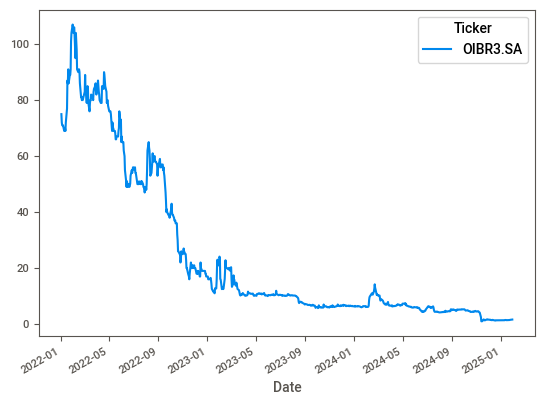

In [42]:
yf.download('OIBR3.SA', start = '2022-01-01')['Close'].plot();

In [31]:
oi = yf.download('OIBR3.SA', start = '2022-01-01')

[*********************100%***********************]  1 of 1 completed


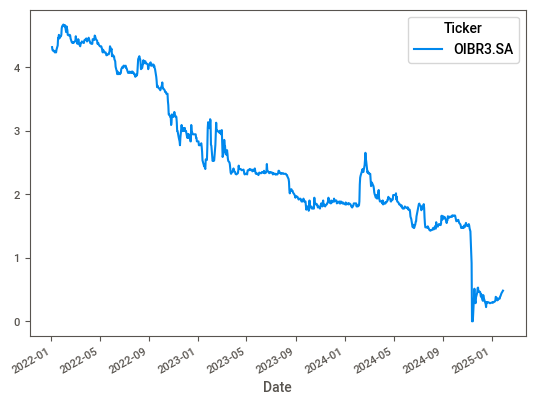

In [32]:
np.log(oi.Close).plot();

In [33]:
weg = yf.download('WEGE3.SA')

[*********************100%***********************]  1 of 1 completed


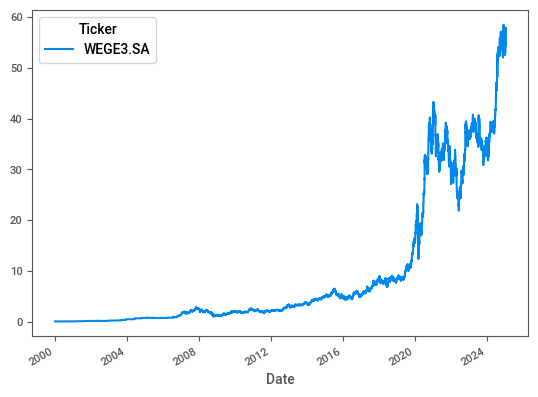

In [35]:
weg.Close.plot();

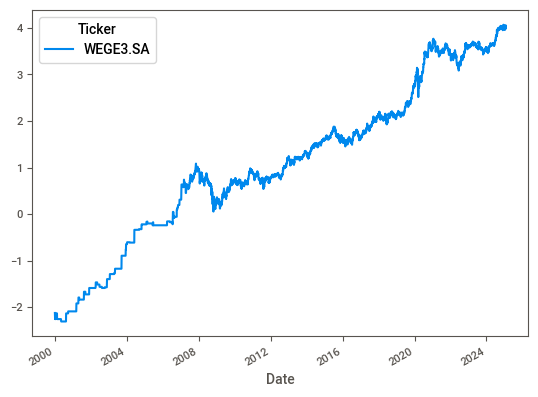

In [36]:
np.log(weg.Close).plot();

**Inverso da função logarítmica -> função exponencial**

In [37]:
np.exp(10)

22026.465794806718

In [38]:
np.exp(0.30010459245033816)

1.35

In [39]:
np.log(100)

4.605170185988092

In [40]:
np.exp(4.605170185988092)

100.00000000000004

**Alguns preferem a base 10**

In [41]:
print(np.log10(10))
print(np.log10(100))
print(np.log10(1000))

1.0
2.0
3.0


#### **3.2.3. Normalização**

In [43]:
ibov_sp500_tickers = ['^BVSP', '^GSPC']
ibov_sp500 = yf.download(ibov_sp500_tickers, period='max')['Close']

[*********************100%***********************]  2 of 2 completed


In [44]:
ibov_sp500_red = ibov_sp500.dropna()
ibov_sp500_red = ibov_sp500_red[ibov_sp500_red.index>='2000']

In [45]:
ibov_sp500_red

Ticker,^BVSP,^GSPC
Date,,
2000-01-03,16930.0,1455.219971
2000-01-04,15851.0,1399.420044
2000-01-05,16245.0,1402.109985
2000-01-06,16107.0,1403.449951
2000-01-07,16309.0,1441.469971
...,...,...
2025-01-17,122350.0,5996.660156
2025-01-21,123338.0,6049.240234
2025-01-22,122972.0,6086.370117


In [46]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=ibov_sp500_red.index, y=ibov_sp500_red['^GSPC'],
                         name='S&P 500', line=dict(color='blue', width=3)))

fig.add_trace(go.Scatter(x=ibov_sp500_red.index, y=ibov_sp500_red['^BVSP'],
                         name='IBOV', line=dict(color='red', width=3)))

fig.update_layout(xaxis_rangeslider_visible=False, margin=dict(l=120, r=20, t=20, b=20), template = 'simple_white',
                  paper_bgcolor="#f7f8fa", width=800,height=400)
fig.show()

In [47]:
ibov_sp500_normalizado = ibov_sp500_red/ibov_sp500_red.iloc[0]
ibov_sp500_normalizado

Ticker,^BVSP,^GSPC
Date,,
2000-01-03,1.000000,1.000000
2000-01-04,0.936267,0.961655
2000-01-05,0.959539,0.963504
2000-01-06,0.951388,0.964425
2000-01-07,0.963320,0.990551
...,...,...
2025-01-17,7.226816,4.120793
2025-01-21,7.285174,4.156925
2025-01-22,7.263556,4.182440


In [48]:
fig = go.Figure()

ibov_sp500_normalizado

fig.add_trace(go.Scatter(x=ibov_sp500_normalizado.index, y=ibov_sp500_normalizado['^GSPC'],
                         name='S&P 500', line=dict(color='blue', width=3)))

fig.add_trace(go.Scatter(x=ibov_sp500_normalizado.index, y=ibov_sp500_normalizado['^BVSP'],
                         name='IBOV', line=dict(color='red', width=3)))

fig.update_layout(xaxis_rangeslider_visible=False, margin=dict(l=120, r=20, t=20, b=20), template = 'simple_white',
                  paper_bgcolor="#f7f8fa", width=800,height=400)
fig.show()

#### **3.2.4. Transformação "scale" (padronização)**

In [49]:
# Baixando os dados de volume de diferentes ativos

tickers = ['VALE3.SA', 'PETR4.SA', 'ITUB4.SA']

Major_IBOV_vol = vbt.YFData.download(tickers, start='5 year ago', interval='1d').get('Volume')
Major_IBOV_vol

symbol,VALE3.SA,PETR4.SA,ITUB4.SA
Date,,,
2020-01-28 03:00:00+00:00,23046400,47259100,17185400
2020-01-29 03:00:00+00:00,23323000,42297500,20071400
2020-01-30 03:00:00+00:00,23083200,44266800,41789800
2020-01-31 03:00:00+00:00,29988200,55446700,25459800
2020-02-03 03:00:00+00:00,18858200,39452800,17586000
...,...,...,...
2025-01-21 03:00:00+00:00,28798700,23612200,14049800
2025-01-22 03:00:00+00:00,34645400,21832200,21037900
2025-01-23 03:00:00+00:00,25097300,26725700,20224000


<Axes: xlabel='Date'>

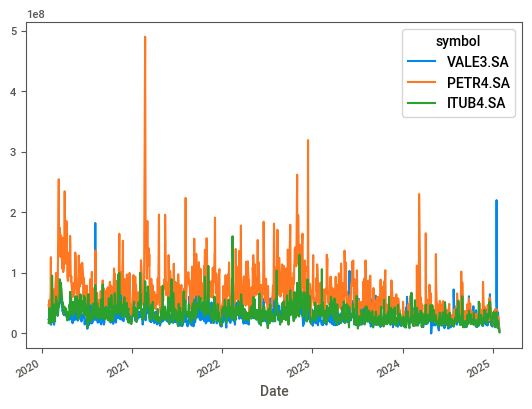

In [50]:
Major_IBOV_vol.plot()

In [51]:
Major_IBOV_vol.vbt.histplot().show()

Quando as escalas são muito diferentes, a padronização dos dados é uma ótima forma pra compará-los
A padronização (scale) transforma os dados de diferentes grandezas para MÉDIA = 0 e VARIÂNCIA = 1

In [52]:
Major_IBOV_vol_scale = Major_IBOV_vol.vbt.scale()
Major_IBOV_vol_scale

symbol,VALE3.SA,PETR4.SA,ITUB4.SA
Date,,,
2020-01-28 03:00:00+00:00,-0.345452,-0.489327,-1.030778
2020-01-29 03:00:00+00:00,-0.325185,-0.619523,-0.847162
2020-01-30 03:00:00+00:00,-0.342755,-0.567847,0.534632
2020-01-31 03:00:00+00:00,0.163177,-0.274478,-0.504334
2020-02-03 03:00:00+00:00,-0.652323,-0.694171,-1.005291
...,...,...,...
2025-01-21 03:00:00+00:00,0.076022,-1.109841,-1.230275
2025-01-22 03:00:00+00:00,0.504413,-1.156549,-0.785670
2025-01-23 03:00:00+00:00,-0.195181,-1.028140,-0.837453


<Axes: xlabel='Date'>

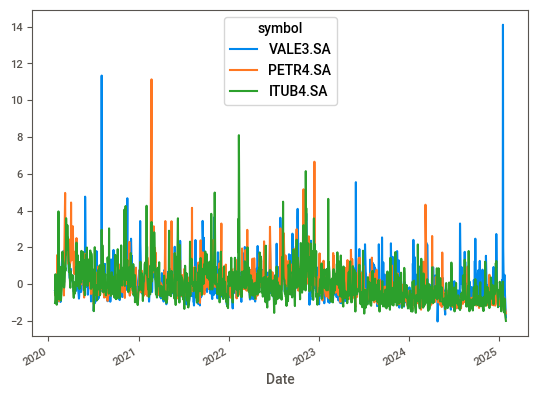

In [53]:
Major_IBOV_vol_scale.plot()

In [54]:
print(Major_IBOV_vol_scale.mean())
print(Major_IBOV_vol_scale.var())

symbol
VALE3.SA   -3.998231e-17
PETR4.SA    2.284703e-17
ITUB4.SA    6.854110e-17
dtype: float64
symbol
VALE3.SA    1.000805
PETR4.SA    1.000805
ITUB4.SA    1.000805
dtype: float64


In [55]:
# Observe a nova distribuição dos dados, incluindo a nova variação do eixo X

Major_IBOV_vol_scale.vbt.histplot().show()

#### **3.2.5. Transformação MINMAX**

MINMAX é outra forma de transformação é baseado nos valores máximos e mínimos <p>
A padronização de mínimo e máximo (minmax_scale) transforma os dados de diferentes grandezas para MÍNIMO = 0 e MÁXIMO = 1

In [56]:
Major_IBOV_vol_minmax = Major_IBOV_vol.vbt.minmax_scale()

In [57]:
Major_IBOV_vol_minmax.vbt.histplot().show()

#### **3.2.6. Binarização**

Muito útil pra definir grupos categóricos baseado em dados contínuos

In [58]:
milho = yf.download('ZC=F', start='2010-01-01', interval='1d')['Close']
resultado_milho = milho.pct_change()*100
resultado_milho.dropna(inplace=True)
resultado_milho

[*********************100%***********************]  1 of 1 completed


Ticker,ZC=F
Date,
2010-01-05,0.059737
2010-01-06,0.716418
2010-01-07,-1.007706
2010-01-08,1.317365
2010-01-11,-0.118203
...,...
2025-01-21,1.187403
2025-01-22,-1.173469
2025-01-23,1.135777


In [59]:
# Usar a transformação binarizar (0 e 1) para classificar em > 1% ou menor que 1% (usando o parâmetro 'threshold')

resul_acima_1porcento = resultado_milho.vbt.binarize(threshold=1)
resul_acima_1porcento

Ticker,ZC=F
Date,
2010-01-05,0.0
2010-01-06,0.0
2010-01-07,0.0
2010-01-08,1.0
2010-01-11,0.0
...,...
2025-01-21,1.0
2025-01-22,0.0
2025-01-23,1.0


## **4. Teste de Hipótese, p-valor e magnitude**
### *Estatística inferencial*
A estatística é uma **ciência sobre a incerteza**: probabilidade de um fenômeno ocorrer, desde que satisfeitas um conjunto de condições teóricas

Fenômeno/observação comumente estão enviesados


Baseado no nosso passado e experiências prévias, tendemos a chegar a conclusões distorcidas.

Na estatística inferencial, fazemos:

* Inferir sobre uma variável da população com base nos dados das amostras (repetições) - é muito difícil estudar a população inteira

* Generalizar uma observação a partir de probabilidades

---
#### **Testes de hipótese**

Os **testes de hipótese** são amplamente utilizados em basicamente todas as áreas da ciência, incluindo a medicina, psicologia, finanças, marketing, entre outras, para testar teorias, avaliar o impacto de intervenções ou mudanças e fazer previsões.

Elas objetivam fornecer um método que permita verificar se os dados amostrais trazem evidências que apóiam ou não uma hipótese formulada.

São complementares aos mais variados testes estatísticos, desde os mais simples como test T, Anova, até os mais complexos, como modelos lineares mistos, logísticos...

<img src="https://editor.analyticsvidhya.com/uploads/52940cover.jpg" width="500" align="left"/>

O processo do teste de hipótese envolve duas hipóteses: a hipótese nula (H0), que é a afirmação a ser testada, e a hipótese alternativa (Ha), que é a afirmação oposta à hipótese nula.

Para realizar o teste, é escolhido um nível de significância (geralmente 5% ou 1%) que define o limite para a rejeição da hipótese nula. A partir da amostra, é calculado um valor chamado de estatística de teste, que é comparado a um valor crítico obtido a partir de uma tabela ou calculado através de métodos estatísticos.


---
**Vejamos na prática como funcionam os testes de hipótese?**

*Exemplo: Quero saber se as médias dos retornos do IBOV diferem entre os meses do ano*

**1° passo: determinar as hipóteses nula e alternativa**

* Hipótese H0 (nula): As médias dos retornos do IBOV <u>não diferem</u> entre os meses do ano, ou seja, são iguais estatisticamente
* Hipótese H1 (alternativa): As médias <u>diferem</u>, são diferentes significativamente

**2° passo: definir o nível de significância de teste**

<img src="https://miro.medium.com/max/1400/1*BwL6FDQ2B3QDKAwmcEVDSg.png" width="500" align="left"/>


**3° passo: executar o teste (seja ele qual for), checar o "valor de p" para decidir qual hipótese foi corroborada**

Se a estatística do teste é menor que o valor crítico, a hipótese nula não é rejeitada, o que significa que não há evidência suficiente para afirmar que a hipótese alternativa é verdadeira.

Por outro lado, se a estatística de teste é maior que o valor crítico, a hipótese nula é rejeitada e concluímos que a hipótese alternativa é provável.

---
#### **Valor de p**

Vamos relembrar que no início do módulo que a estatística enxerga o mundo a partir de duas dimensões:

* Magnitude
* Probabilidade

O teste de hipótese vai se basear no p (probabilidade)


**p-valor**: associado ao nível de significância do teste. De forma pragmática, é uma medida que representa a probabilidade da hipótese nula ser verdadeira considerando o seu conjunto de dados.



> p = 0.05 indica que há uma chance em 1 em 20 de que a hipótese nula seja corroborada. Em outras palavras, 5% de chance de que a relação estudada (resultado do teste estatístico executado) seja devido ao acaso, e não devido a fatores que estão sendo estudados

O valor de "p" é um número entre 0 e 1 e é interpretado da seguinte forma:

* se o valor de p é menor que um nível de significância **pré-definido** (geralmente 0.05 ou 0.01), então a hipótese nula é rejeitada em favor da hipótese alternativa.

Por exemplo, se o valor de p for 0.03 e o nível de significância for 0.05, então a hipótese nula será rejeitada, o que significa que há evidências estatísticas para suportar a hipótese alternativa.
Quanto menor o valor de p, maior é a evidência contra a hipótese nula (**em termos de probabilidade, mas não de efeito**).

---
#### **Magnitude do efeito/relação/comparação**

Além da probablidade de ocorrência, é importante checar o quão forte é o efeito/relação/comparação. Pode ser indicado por diversos parâmetros dependendo do teste, como os coeficiente de correlação (r), coeficiente de determinação (r²), diferença entre as médias (num caso de teste de comparação entre médias)...

Imagine que você encontrou que as médias de retorno mensal do ativo A são significativamente (p<0.05) maiores que as do ativo B, mas a diferença é de 0.02%

#### **Ánálises estatísticas em papers**

**Efeito COVID-19 nos retornos dos principais índices mundiais**

https://koreascience.kr/article/JAKO202020952022559.pdf

**Impacto do rompimento da barragem de Brumadinho nas ações das mineradoras Vale, CSN e Gerdau**

https://www.researchgate.net/profile/Joao-Souza-19/publication/343558749_Impacto_do_rompimento_da_barragem_de_Brumadinho_nas_acoes_das_mineradoras_Vale_CSN_e_Gerdau/links/5f31c0d5458515b7291544d4/Impacto-do-rompimento-da-barragem-de-Brumadinho-nas-acoes-das-mineradoras-Vale-CSN-e-Gerdau.pdf?origin=publicationDetail&_sg%5B0%5D=nZSwW7HBK_qbGkcLbZuVZQOos4Lip4U8I70cyPrDOllyg8e7fWx5DS0-cdQUyquLy4RveuTHjXB402xDJTPDxQ.fZAaA6tD7bOS-i0Mkf4e8w9rclOKF4J_dkMy08XUuPcxwkWvLkRq0_tdyxJx-OFDEZQO-QvhnpBQyBtTXGKD5Q&_sg%5B1%5D=eAGbmW-rb728LIdGRg6LzT7MSV0oNS2s7sOH7cI29U2oP2DjF93tpV9hy7kqB456ugfUUynA9CXil4VX5NihhCkvKSAK8ds2Qm5RDTBKH8Yj.fZAaA6tD7bOS-i0Mkf4e8w9rclOKF4J_dkMy08XUuPcxwkWvLkRq0_tdyxJx-OFDEZQO-QvhnpBQyBtTXGKD5Q&_iepl=&_rtd=eyJjb250ZW50SW50ZW50IjoibWFpbkl0ZW0ifQ%3D%3D

## **5. Comparação de médias entre grupos (Teste T e Anova)**

Envolvem a análise de dados quantitativos (variável resposta) e qualitativos (grupos)

Sem dúvida estão entre os testes mais utilizados na ciência de dados como um todo. Para dados de séries temporais acabam sendo menos utilizados, já que este tipo de dado viola uma das premissas principais que é a aleatoriedade e independência das observações.

### **5.1. Organizar um banco de dados para os testes**

Antes dos testes propriamente ditos, vamos organizar um banco de dados de Dividend Yield por setor do IBOV, considerando o ano de 2022

Criamos um dicionário para armazenar os ativos e setores do IBOV (utilizamos os espaçamentos apenas para facilitar a visualização)

[Clique aqui para acessar a seção de importação e instalação de bibliotecas](#importar)

In [61]:
ativos_setor_IBOV = {"AZUL4" : "Bens_industriais", "CCRO3" : "Bens_industriais", "ECOR3" : "Bens_industriais", "EMBR3" : "Bens_industriais",
                     "GOLL4" : "Bens_industriais", "RAIL3" : "Bens_industriais", "WEGE3" : "Bens_industriais",

                     "ALPA4" : "Consumo_ciclico", "ARZZ3" : "Consumo_ciclico", "CVCB3" : "Consumo_ciclico", "CYRE3" : "Consumo_ciclico",
                     "EZTC3" : "Consumo_ciclico", "LREN3" : "Consumo_ciclico", "MGLU3" : "Consumo_ciclico", "MRVE3" : "Consumo_ciclico",
                     "PETZ3" : "Consumo_ciclico", "SOMA3" : "Consumo_ciclico", "VIIA3" : "Consumo_ciclico",

                     "ABEV3" : "Consumo_nao_ciclico", "ASAI3" : "Consumo_nao_ciclico", "BEEF3" : "Consumo_nao_ciclico",
                     "BRFS3" : "Consumo_nao_ciclico", "CRFB3" : "Consumo_nao_ciclico", "JBSS3" : "Consumo_nao_ciclico",
                     "MRFG3" : "Consumo_nao_ciclico", "NTCO3" : "Consumo_nao_ciclico", "PCAR3" : "Consumo_nao_ciclico",
                     "RAIZ4" : "Consumo_nao_ciclico", "SLCE3" : "Consumo_nao_ciclico", "SMTO3" : "Consumo_nao_ciclico",

                     "ALSO3" : "Financeiro_e_outros", "B3SA3" : "Financeiro_e_outros", "BBAS3" : "Financeiro_e_outros",
                     "BBDC3" : "Financeiro_e_outros", "BBDC4" : "Financeiro_e_outros", "BBSE3" : "Financeiro_e_outros",
                     "BPAC11" : "Financeiro_e_outros", "BPAN4" : "Financeiro_e_outros", "CIEL3" : "Financeiro_e_outros",
                     "IGTI11" : "Financeiro_e_outros", "ITSA4" : "Financeiro_e_outros", "ITUB4" : "Financeiro_e_outros",
                     "MULT3" : "Financeiro_e_outros", "SANB11" : "Financeiro_e_outros",

                     "BRAP4" : "Mats_basicos", "BRKM5" : "Mats_basicos", "CMIN3" : "Mats_basicos", "CSNA3" : "Mats_basicos", "DXCO3" : "Mats_basicos",
                     "GGBR4" : "Mats_basicos", "GOAU4" : "Mats_basicos", "KLBN11" : "Mats_basicos", "SUZB3" : "Mats_basicos", "USIM5" : "Mats_basicos",
                     "VALE3" : "Mats_basicos",

                     "CSAN3" : "Petroleo_gas_biocombustiveis", "PETR3" : "Petroleo_gas_biocombustiveis", "PETR4" : "Petroleo_gas_biocombustiveis",
                     "PRIO3" : "Petroleo_gas_biocombustiveis", "RRRP3" : "Petroleo_gas_biocombustiveis", "UGPA3" : "Petroleo_gas_biocombustiveis",
                     "VBBR3" : "Petroleo_gas_biocombustiveis",

                     "FLRY3" : "Saude", "HAPV3" : "Saude", "HYPE3" : "Saude", "QUAL3" : "Saude", "RADL3" : "Saude", "RDOR3" : "Saude",

                     "CMIG4" : "Utilidade_publica", "CPFE3" : "Utilidade_publica", "CPLE6" : "Utilidade_publica", "EGIE3" : "Utilidade_publica",
                     "ELET3" : "Utilidade_publica", "ELET6" : "Utilidade_publica", "ENBR3" : "Utilidade_publica", "ENEV3" : "Utilidade_publica",
                     "ENGI11" : "Utilidade_publica", "EQTL3" : "Utilidade_publica", "SBSP3" : "Utilidade_publica", "TAEE11" : "Utilidade_publica"}

In [62]:
list(ativos_setor_IBOV.keys())

['AZUL4',
 'CCRO3',
 'ECOR3',
 'EMBR3',
 'GOLL4',
 'RAIL3',
 'WEGE3',
 'ALPA4',
 'ARZZ3',
 'CVCB3',
 'CYRE3',
 'EZTC3',
 'LREN3',
 'MGLU3',
 'MRVE3',
 'PETZ3',
 'SOMA3',
 'VIIA3',
 'ABEV3',
 'ASAI3',
 'BEEF3',
 'BRFS3',
 'CRFB3',
 'JBSS3',
 'MRFG3',
 'NTCO3',
 'PCAR3',
 'RAIZ4',
 'SLCE3',
 'SMTO3',
 'ALSO3',
 'B3SA3',
 'BBAS3',
 'BBDC3',
 'BBDC4',
 'BBSE3',
 'BPAC11',
 'BPAN4',
 'CIEL3',
 'IGTI11',
 'ITSA4',
 'ITUB4',
 'MULT3',
 'SANB11',
 'BRAP4',
 'BRKM5',
 'CMIN3',
 'CSNA3',
 'DXCO3',
 'GGBR4',
 'GOAU4',
 'KLBN11',
 'SUZB3',
 'USIM5',
 'VALE3',
 'CSAN3',
 'PETR3',
 'PETR4',
 'PRIO3',
 'RRRP3',
 'UGPA3',
 'VBBR3',
 'FLRY3',
 'HAPV3',
 'HYPE3',
 'QUAL3',
 'RADL3',
 'RDOR3',
 'CMIG4',
 'CPFE3',
 'CPLE6',
 'EGIE3',
 'ELET3',
 'ELET6',
 'ENBR3',
 'ENEV3',
 'ENGI11',
 'EQTL3',
 'SBSP3',
 'TAEE11']

In [63]:
# Adicionamos o '.SA' necessário ao Yahoo! Finance

lista_ativos = list(ativos_setor_IBOV.keys())
lista_ativos_yf = [lista_ativos + '.SA' for lista_ativos in lista_ativos]
lista_ativos_yf[0:5]

['AZUL4.SA', 'CCRO3.SA', 'ECOR3.SA', 'EMBR3.SA', 'GOLL4.SA']

In [64]:
# Buscar os dados de 2022 (precisaremos de Dividends e Close)

df_dados = yf.download(lista_ativos_yf, start='2022-01-01', end='2022-12-31', actions=True)[['Close', 'Dividends']]

[*********************100%***********************]  80 of 80 completed

7 Failed downloads:
['CIEL3.SA', 'RRRP3.SA', 'ALSO3.SA', 'ENBR3.SA', 'ARZZ3.SA', 'SOMA3.SA', 'VIIA3.SA']: YFTzMissingError('$%ticker%: possibly delisted; no timezone found')


In [65]:
# Observe que os ativos são automaticamente classificados por ordem alfabética

df_dados

Price           Close                                                     \
Ticker       ABEV3.SA   ALPA4.SA ALSO3.SA ARZZ3.SA   ASAI3.SA   AZUL4.SA   
Date                                                                       
2022-01-03  13.116380  34.273540      NaN      NaN  12.337970  24.420000   
2022-01-04  13.099268  33.284306      NaN      NaN  12.337970  24.400000   
2022-01-05  12.842587  32.005291      NaN      NaN  11.629893  22.360001   
2022-01-06  12.637242  32.514896      NaN      NaN  11.241907  23.049999   
2022-01-07  12.431897  32.325047      NaN      NaN  11.018815  23.900000   
...               ...        ...      ...      ...        ...        ...   
2022-12-23  13.167993  14.800000      NaN      NaN  19.576340  11.450000   
2022-12-26  13.077926  14.680000      NaN      NaN  19.488333  11.360000   
2022-12-27  13.077926  14.450000      NaN      NaN  18.872295  10.740000   
2022-12-28  13.104945  15.120000      NaN      NaN  18.999414  11.160000   
2022-12-29  13.077926  15.080000      NaN      NaN  19.074909  11.010000   

Price                                                   ... Dividends  \
Ticker       B3SA3.SA   BBAS3.SA   BBDC3.SA   BBDC4.SA  ...  SBSP3.SA   
Date                                                    ...             
2022-01-03   9.595892  11.376044  12.377840  14.801211  ...       0.0   
2022-01-04   9.801770  11.387885  12.435674  14.898251  ...       0.0   
2022-01-05   9.595892  11.198418  12.353319  14.792911  ...       0.0   
2022-01-06   9.828627  11.289202  12.488084  15.003592  ...       0.0   
2022-01-07  10.061362  11.301046  12.540490  15.221801  ...       0.0   
...               ...        ...        ...        ...  ...       ...   
2022-12-23  12.339758  15.050946  11.274159  12.813143  ...       0.0   
2022-12-26  12.404459  15.029614  11.012559  12.508472  ...       0.0   
2022-12-27  11.970024  14.530476  11.080067  12.449231  ...       0.0   
2022-12-28  12.385971  14.790710  11.417620  12.830070  ...       0.0   
2022-12-29  12.210350  14.816309  11.366989  12.821607  ...       0.0   

Price                                                                        \
Ticker      SLCE3.SA SMTO3.SA SUZB3.SA TAEE11.SA UGPA3.SA USIM5.SA VALE3.SA   
Date                                                                          
2022-01-03  0.000000      0.0      0.0       0.0      0.0      0.0      0.0   
2022-01-04  0.000000      0.0      0.0       0.0      0.0      0.0      0.0   
2022-01-05  0.000000      0.0      0.0       0.0      0.0      0.0      0.0   
2022-01-06  0.000000      0.0      0.0       0.0      0.0      0.0      0.0   
2022-01-07  0.000000      0.0      0.0       0.0      0.0      0.0      0.0   
...              ...      ...      ...       ...      ...      ...      ...   
2022-12-23  0.000000      0.0      0.0       0.0      0.0      0.0      0.0   
2022-12-26  0.000000      0.0      0.0       0.0      0.0      0.0      0.0   
2022-12-27  0.158071      0.0      0.0       0.0      0.0      0.0      0.0   
2022-12-28  0.000000      0.0      0.0       0.0      0.0      0.0      0.0   
2022-12-29  0.000000      0.0      0.0       0.0      0.0      0.0      0.0   

Price                         
Ticker     VBBR3.SA WEGE3.SA  
Date                          
2022-01-03      0.0      0.0  
2022-01-04      0.0      0.0  
2022-01-05      0.0      0.0  
2022-01-06      0.0      0.0  
2022-01-07      0.0      0.0  
...             ...      ...  
2022-12-23      0.0      0.0  
2022-12-26      0.0      0.0  
2022-12-27      0.0      0.0  
2022-12-28      0.0      0.0  
2022-12-29      0.0      0.0  

[250 rows x 153 columns]

In [66]:
# Precisaremos da soma dos dividendos pagos no ano para cada ativo

soma_dividendos = df_dados['Dividends'].sum()
soma_dividendos

Ticker
ABEV3.SA    0.762300
ALPA4.SA    0.163028
ASAI3.SA    0.162098
AZUL4.SA    0.000000
B3SA3.SA    0.469106
              ...   
UGPA3.SA    0.582870
USIM5.SA    0.629128
VALE3.SA    7.583326
VBBR3.SA    0.856178
WEGE3.SA    0.515680
Length: 73, dtype: float64

In [67]:
# E do preço de fechamento do último dia do ano

close_ativo = df_dados['Close'].iloc[-1]
close_ativo

Ticker
ABEV3.SA    13.077926
ALPA4.SA    15.080000
ALSO3.SA          NaN
ARZZ3.SA          NaN
ASAI3.SA    19.074909
              ...    
USIM5.SA     6.601693
VALE3.SA    76.511192
VBBR3.SA    13.895247
VIIA3.SA          NaN
WEGE3.SA    37.228348
Name: 2022-12-29 00:00:00, Length: 80, dtype: float64

In [68]:
# Tabela com os Dividend Yield (%) anuais de cada ativo
# Ordenar para concatenar com o df dos setores

tabela_DY_2022 = pd.DataFrame(soma_dividendos/close_ativo*100, columns=['DY_%'])
tabela_DY_2022.sort_index()

,DY_%
Ticker,
ABEV3.SA,5.828906
ALPA4.SA,1.081088
ALSO3.SA,NaN
ARZZ3.SA,NaN
ASAI3.SA,0.849797
...,...
USIM5.SA,9.529798
VALE3.SA,9.911394
VBBR3.SA,6.161661


In [69]:
# Retomar os dados do dicionario inicial

df_ativos_setor = pd.DataFrame(data=ativos_setor_IBOV.items(), index=ativos_setor_IBOV.keys(), columns=['Ativo', 'Setor']).drop('Ativo', axis=1)
df_ativos_setor = df_ativos_setor.sort_index()
df_ativos_setor

,Setor
ABEV3,Consumo_nao_ciclico
ALPA4,Consumo_ciclico
ALSO3,Financeiro_e_outros
ARZZ3,Consumo_ciclico
ASAI3,Consumo_nao_ciclico
...,...
USIM5,Mats_basicos
VALE3,Mats_basicos
VBBR3,Petroleo_gas_biocombustiveis
VIIA3,Consumo_ciclico


In [70]:
# Remover o '.SA' dos ativos (existem outras formas, mas acredito que esse seja um dos mais simples)
# Primeiro criaremos um dicionário com os nomes a serem substituídos (listas criadas acima no código)

nome_corrigido = dict(zip(lista_ativos_yf, lista_ativos))
print(nome_corrigido)

{'AZUL4.SA': 'AZUL4', 'CCRO3.SA': 'CCRO3', 'ECOR3.SA': 'ECOR3', 'EMBR3.SA': 'EMBR3', 'GOLL4.SA': 'GOLL4', 'RAIL3.SA': 'RAIL3', 'WEGE3.SA': 'WEGE3', 'ALPA4.SA': 'ALPA4', 'ARZZ3.SA': 'ARZZ3', 'CVCB3.SA': 'CVCB3', 'CYRE3.SA': 'CYRE3', 'EZTC3.SA': 'EZTC3', 'LREN3.SA': 'LREN3', 'MGLU3.SA': 'MGLU3', 'MRVE3.SA': 'MRVE3', 'PETZ3.SA': 'PETZ3', 'SOMA3.SA': 'SOMA3', 'VIIA3.SA': 'VIIA3', 'ABEV3.SA': 'ABEV3', 'ASAI3.SA': 'ASAI3', 'BEEF3.SA': 'BEEF3', 'BRFS3.SA': 'BRFS3', 'CRFB3.SA': 'CRFB3', 'JBSS3.SA': 'JBSS3', 'MRFG3.SA': 'MRFG3', 'NTCO3.SA': 'NTCO3', 'PCAR3.SA': 'PCAR3', 'RAIZ4.SA': 'RAIZ4', 'SLCE3.SA': 'SLCE3', 'SMTO3.SA': 'SMTO3', 'ALSO3.SA': 'ALSO3', 'B3SA3.SA': 'B3SA3', 'BBAS3.SA': 'BBAS3', 'BBDC3.SA': 'BBDC3', 'BBDC4.SA': 'BBDC4', 'BBSE3.SA': 'BBSE3', 'BPAC11.SA': 'BPAC11', 'BPAN4.SA': 'BPAN4', 'CIEL3.SA': 'CIEL3', 'IGTI11.SA': 'IGTI11', 'ITSA4.SA': 'ITSA4', 'ITUB4.SA': 'ITUB4', 'MULT3.SA': 'MULT3', 'SANB11.SA': 'SANB11', 'BRAP4.SA': 'BRAP4', 'BRKM5.SA': 'BRKM5', 'CMIN3.SA': 'CMIN3', 'CSNA3

In [71]:
# Usando o dicionario, substituimos os valores referenciados (caso algum ativo não esteja disponível, ele simplesmente ignora)
# Aproveitamos e já concatenamos agora q os dois índices estão idênticos

tabela_DY_2022.rename(nome_corrigido, axis=0, inplace=True)
dados_setor_DY = pd.concat([df_ativos_setor, tabela_DY_2022], axis=1)
dados_setor_DY

,Setor,DY_%
ABEV3,Consumo_nao_ciclico,5.828906
ALPA4,Consumo_ciclico,1.081088
ALSO3,Financeiro_e_outros,NaN
ARZZ3,Consumo_ciclico,NaN
ASAI3,Consumo_nao_ciclico,0.849797
...,...,...
USIM5,Mats_basicos,9.529798
VALE3,Mats_basicos,9.911394
VBBR3,Petroleo_gas_biocombustiveis,6.161661
VIIA3,Consumo_ciclico,NaN


Pronto! Temos nosso banco de dados para testar algumas perguntas

---

### **5.2. Teste T de Student**

Comparação entre médias de 2 grupos

*Exemplo: existe diferença significativa entre os setores "Utilidade Pública" e "Financeiro e outros" do IBOV quanto à média de Dividend Yield (%) para 2022?*

* Hipótese H0 (nula): As médias de DY não diferem entre os dois setores
* Hipótese H1 (alternativa): As médias são diferentes estatisticamente

[Clique aqui para acessar a seção de importação e instalação de bibliotecas](#importar)

In [72]:
# Filtrar os dados de interesse
# Relembrando nossa pergunta: "Existe diferença significativa entre os setores
# "Utilidade Pública" e "Consumo não cíclico" do IBOV quanto à média de Dividend Yield (%) para 2022?""

dados_test_T = dados_setor_DY[(dados_setor_DY.Setor=='Utilidade_publica') | (dados_setor_DY.Setor=='Financeiro_e_outros')]
dados_test_T

,Setor,DY_%
ALSO3,Financeiro_e_outros,NaN
B3SA3,Financeiro_e_outros,3.841872
BBAS3,Financeiro_e_outros,9.440442
BBDC3,Financeiro_e_outros,3.489834
BBDC4,Financeiro_e_outros,3.403302
BBSE3,Financeiro_e_outros,6.973270
BPAC11,Financeiro_e_outros,2.909559
BPAN4,Financeiro_e_outros,9.277944
CIEL3,Financeiro_e_outros,NaN
CMIG4,Utilidade_publica,22.453795


##### **Testar a premissa de que os dados de cada grupo são normais**

*Lembrando que no teste de normalidade a hipótese H0 é de que os dados são normais, ou seja, buscaremos um p>0.05 para não rejeitar H0*

In [73]:
dados_utilidade_publ = dados_test_T[(dados_test_T.Setor=='Utilidade_publica')]['DY_%']
teste_normalidade_G1 = stats.normaltest(dados_utilidade_publ)
print(teste_normalidade_G1)

NormaltestResult(statistic=nan, pvalue=nan)


In [74]:
dados_financeiro = dados_test_T[(dados_test_T.Setor=='Financeiro_e_outros')]['DY_%']
teste_normalidade_G2 = stats.normaltest(dados_financeiro)
print(teste_normalidade_G2)

NormaltestResult(statistic=nan, pvalue=nan)


##### **Testar se a homogeneidade de variâncias (homocedasticidade) entre os dois grupos**

Não chega a ser uma premissa, mas é importante informar no teste se há homogeneidade ou não nas variâncias

In [75]:
# Assim como no teste de normalidade, H0 é de que as variâncias são homogenêas

stats.levene(dados_utilidade_publ, dados_financeiro)

LeveneResult(statistic=nan, pvalue=nan)

##### **Visualizando os dados das médias e desvios dos grupos**

In [76]:
# Tabela dinâmica para calcular média e desvio

tab_dinamica = pd.pivot_table(dados_test_T, values=['DY_%'], index=['Setor'], aggfunc=['mean','std']).droplevel(1, axis=1)
tab_dinamica

,mean,std
Setor,,
Financeiro_e_outros,5.602554,2.860686
Utilidade_publica,7.388217,6.562803


In [77]:
fig = go.Figure()

fig.add_trace(go.Bar(name='Média e Desvio', x=tab_dinamica.index, y=tab_dinamica['mean'],
                     error_y=dict(type='data', array=tab_dinamica['std']),
                     marker_color='orange', orientation='v'))

fig.update_layout(title_text='<b>Dividend Yield (média \xB1 erro padrão da média) <br> em 2022 entre dois setores do IBOV', xaxis_title= '<b>Setor IBOV',
                  yaxis_title= '<b>Dividend Yield (%)', template="none", margin=dict(l=75, r=20, t=75, b=75),
                  paper_bgcolor="#f7f8fa", font=dict(family="Arial", size=13, color="black"), width=600, height=400)

fig.show()

##### **Chegamos ao código do Teste T**

In [78]:
# Aqui informamos no parâmetro "equal_var" o resultado do teste de Levene

t_stat, p_value = stats.ttest_ind(dados_utilidade_publ, dados_financeiro, equal_var=False)
print("T-statistic value: ", t_stat)
print("P-Value: ", p_value)

T-statistic value:  nan
P-Value:  nan


##### **Resultado final**

*Exemplo: existe diferença significativa entre os setores "Utilidade Pública" e "Consumo não cíclico" do IBOV quanto à média de Dividend Yield (%) para 2022?*

* Hipótese H0 (nula): As médias de DY não diferem entre os dois setores
* Hipótese H1 (alternativa): As médias são diferentes estatisticamente

p > 0.05, não rejeitamos nossa hipotese H0

As médias de DY entre os setores "Utilidade Pública" e "Consumo não cíclico" para 2022 não diferem estatisticamente

---
### **5.3. ANOVA (Análise de Variância)**

Comparação entre médias de 3 ou mais grupos

##### **Hipóteses**

*Exemplo: existe diferença significativa entre os setores do IBOV quanto à média de Dividend Yield (%) para 2022?*

* Hipótese H0 (nula): As médias de DY não diferem entre os setores
* Hipótese H1 (alternativa): As médias são diferentes estatisticamente

[Clique aqui para acessar a seção de importação e instalação de bibliotecas](#importar)

In [79]:
# Retomar os dados de DY com todos os setores do IBOV

dados_setor_DY

,Setor,DY_%
ABEV3,Consumo_nao_ciclico,5.828906
ALPA4,Consumo_ciclico,1.081088
ALSO3,Financeiro_e_outros,NaN
ARZZ3,Consumo_ciclico,NaN
ASAI3,Consumo_nao_ciclico,0.849797
...,...,...
USIM5,Mats_basicos,9.529798
VALE3,Mats_basicos,9.911394
VBBR3,Petroleo_gas_biocombustiveis,6.161661
VIIA3,Consumo_ciclico,NaN


##### **Visualizando os dados das médias e desvios dos grupos**

In [80]:
pd.pivot_table(dados_setor_DY, values=['DY_%'], index=['Setor'], aggfunc=['mean','std'])

,mean,std
,DY_%,DY_%
Setor,,
Bens_industriais,0.645630,1.094003
Consumo_ciclico,2.661757,2.595822
Consumo_nao_ciclico,6.778124,10.229683
Financeiro_e_outros,5.602554,2.860686
Mats_basicos,13.066439,6.430861
Petroleo_gas_biocombustiveis,33.791397,47.149215
Saude,2.863039,2.515477
Utilidade_publica,7.388217,6.562803


In [81]:
# Tabela dinâmica para calcular média e desvio

tab_dinamica = pd.pivot_table(dados_setor_DY, values=['DY_%'], index=['Setor'], aggfunc=['mean','std']).droplevel(1, axis=1)
tab_dinamica

,mean,std
Setor,,
Bens_industriais,0.645630,1.094003
Consumo_ciclico,2.661757,2.595822
Consumo_nao_ciclico,6.778124,10.229683
Financeiro_e_outros,5.602554,2.860686
Mats_basicos,13.066439,6.430861
Petroleo_gas_biocombustiveis,33.791397,47.149215
Saude,2.863039,2.515477
Utilidade_publica,7.388217,6.562803


In [82]:
fig = go.Figure()

fig.add_trace(go.Bar(name='Média e Desvio', x=tab_dinamica.index, y=tab_dinamica['mean'],
                     error_y=dict(type='data', array=tab_dinamica['std']),
                     marker_color='lightblue', orientation='v'))

fig.update_layout(title_text='<b>Dividend Yield (média \xB1 desvio padrão da média) <br> em 2022 entre os setores do IBOV', xaxis_title= '<b>Setor IBOV',
                  yaxis_title= '<b>Dividend Yield (%)', template="none", margin=dict(l=75, r=20, t=75, b=75),
                  paper_bgcolor="#f7f8fa", font=dict(family="Arial", size=13, color="black"), width=1200, height=600)

fig.show()

In [83]:
# Precisaremos separar os dados para fazer o teste de homogeneidade de variâncias

dados_grupos = dados_setor_DY.groupby('Setor')['DY_%']
dados_Bens_industriais = dados_grupos.get_group("Bens_industriais")
dados_Consumo_ciclico = dados_grupos.get_group("Consumo_ciclico")
dados_Consumo_nao_ciclico = dados_grupos.get_group("Consumo_nao_ciclico")
dados_Financeiro_e_outros = dados_grupos.get_group("Financeiro_e_outros")
dados_Mats_basicos = dados_grupos.get_group("Mats_basicos")
dados_Petroleo_gas_biocombustiveis = dados_grupos.get_group("Petroleo_gas_biocombustiveis")
dados_Saude = dados_grupos.get_group("Saude")
dados_Utilidade_publica = dados_grupos.get_group("Utilidade_publica")

In [84]:
dados_grupos.get_group('Bens_industriais')

AZUL4    0.000000
CCRO3    2.852710
ECOR3    0.176940
EMBR3    0.000000
GOLL4    0.000000
RAIL3    0.104581
WEGE3    1.385181
Name: DY_%, dtype: float64

In [85]:
dados_Utilidade_publica

CMIG4     22.453795
CPFE3     10.664564
CPLE6     13.601844
EGIE3      8.988872
ELET3      1.915638
ELET6      4.255191
ENBR3           NaN
ENEV3      0.000000
ENGI11     8.212903
EQTL3      2.427883
SBSP3      1.726261
TAEE11     7.023440
Name: DY_%, dtype: float64

In [86]:
values_per_group = [col for col_name, col in dados_setor_DY.groupby('Setor')['DY_%']]

O raciocínio para esta segunda forma de obter os dados é o seguinte:

A função groupby divide um DataFrame em tuplas (group_name, DataFrame). Dado uma coluna de grupo 1 e uma coluna de valores 2, você pode usar uma compreensão de lista com um objeto groupby df.groupby(1), extrair apenas as colunas de valores df.groupb(1)[2] e então iterar através das tuplas do groupby mantendo os valores (col) e descartando os nomes (col_names)

In [87]:
dados_setor_DY.groupby('Setor')

In [88]:
type(values_per_group)

list

In [89]:
values_per_group[0]

AZUL4    0.000000
CCRO3    2.852710
ECOR3    0.176940
EMBR3    0.000000
GOLL4    0.000000
RAIL3    0.104581
WEGE3    1.385181
Name: DY_%, dtype: float64

##### **Teste de Levene**

**Testar se há homogeneidade de variâncias (homocedasticidade) entre os grupos**

Para a ANOVA é uma premissa fundamental. Caso não seja verificada a homocedasticidade, pode ser necessário transformar os dados (ex., raiz quadrada ou log)

In [90]:
# Assim como no teste de normalidade, H0 é de que as variâncias são homogenêas

stats.levene(dados_Bens_industriais, dados_Consumo_ciclico, dados_Consumo_nao_ciclico, dados_Financeiro_e_outros, dados_Mats_basicos,
             dados_Petroleo_gas_biocombustiveis, dados_Saude, dados_Utilidade_publica)

LeveneResult(statistic=nan, pvalue=nan)

In [ ]:
stats.levene(*values_per_group)

LeveneResult(statistic=3.0543292654049736, pvalue=0.007157579200286523)

In [ ]:
# Checar a variância de cada grupo
# Notar a grande diferença entre alguns grupos
# Nem precisava de teste para observar que são diferentes

dados_setor_DY.groupby('Setor').var()

,DY_%
Setor,
Bens_industriais,1.690290
Consumo_ciclico,4.813188
Consumo_nao_ciclico,75.737552
Financeiro_e_outros,5.264179
Mats_basicos,26.673694
Petroleo_gas_biocombustiveis,899.925477
Saude,5.551142
Utilidade_publica,28.186183


In [ ]:
# Retirando o setor Petroleo_gas_biocombustiveis conseguimos grupos com variância homogênea

stats.levene(dados_Bens_industriais, dados_Consumo_ciclico, dados_Consumo_nao_ciclico, dados_Financeiro_e_outros, dados_Mats_basicos,
             dados_Saude, dados_Utilidade_publica)

LeveneResult(statistic=1.3472151285377434, pvalue=0.24915495085233544)

##### **Chegamos ao código da ANOVA**

In [ ]:
stats.f_oneway(dados_Bens_industriais, dados_Consumo_ciclico, dados_Consumo_nao_ciclico, dados_Financeiro_e_outros, dados_Mats_basicos,
             dados_Saude, dados_Utilidade_publica)

F_onewayResult(statistic=5.316175183661983, pvalue=0.00015947446974354812)

**O resultado mostra um valor de p <0.05, ou seja, rejeitamos H0 e aceitamos H1. Isso significa que há diferença significativa entre as médias dos grupos avaliados.**

**Entretanto, qual grupo é diferente de qual? Em um teste T, basta olhar qual média é maior. Mas e quando temos mais grupos, como na ANOVA?**

##### **Post-hoc Tukey (par a par)**

Compara todos os possíveis pares de médias

Necessário apenas quando a ANOVA dá um resultado significativo (P<0.05)

In [ ]:
dados_setor_DY_sem_petroleo = dados_setor_DY[dados_setor_DY.Setor!='Petroleo_gas_biocombustiveis']

tukey = pairwise_tukeyhsd(endog=dados_setor_DY_sem_petroleo['DY_%'],
                          groups=dados_setor_DY_sem_petroleo['Setor'],
                          alpha=0.05)

In [ ]:
print(tukey)

              Multiple Comparison of Means - Tukey HSD, FWER=0.05              
       group1              group2       meandiff p-adj   lower    upper  reject
-------------------------------------------------------------------------------
   Bens_industriais     Consumo_ciclico   1.3954    0.9  -5.7627  8.5534  False
   Bens_industriais Consumo_nao_ciclico   5.3034 0.2641  -1.7377 12.3446  False
   Bens_industriais Financeiro_e_outros     3.94 0.5755  -2.9134 10.7933  False
   Bens_industriais        Mats_basicos  10.6528  0.001   3.4947 17.8109   True
   Bens_industriais               Saude   1.9929    0.9  -6.2438 10.2296  False
   Bens_industriais   Utilidade_publica    6.412 0.0975  -0.6292 13.4531  False
    Consumo_ciclico Consumo_nao_ciclico   3.9081 0.4741  -2.2718  10.088  False
    Consumo_ciclico Financeiro_e_outros   2.5446  0.834  -3.4204  8.5097  False
    Consumo_ciclico        Mats_basicos   9.2575  0.001   2.9446 15.5703   True
    Consumo_ciclico               Saude 

In [ ]:
# Retomando nossa tabela dinâmica para facilitar

tab_dinamica

,mean,std
Setor,,
Bens_industriais,0.725128,1.300112
Consumo_ciclico,2.120482,2.193898
Consumo_nao_ciclico,6.028567,8.702732
Financeiro_e_outros,4.665107,2.294380
Mats_basicos,11.377954,5.164658
Petroleo_gas_biocombustiveis,20.480033,29.998758
Saude,2.718071,2.356086
Utilidade_publica,7.137107,5.309066


---

### **5.4. Teste T pareado**

Comparação entre médias de 2 grupos mas incluindo um fator de dependência (par a par)

<left><img src = "https://datatab.net/assets/tutorial/paired_t-Test.png" width = "600">

*Weekend effect: o retorno da segunda-feira é frequentemente menor que o da sexta-feira que a precede*


O "Efeito final de semana" ficou muito conhecido no mercado financeiro nas décadas de 80 e 90. 

Diversos estudos comprovaram que a média dos retornos da segunda feira eram estatisticamente menores que as médias dos retornos das sextas feiras que as antecedia. 

Apesar de muito ter sido discutido sobre os motivos, não se chegaram a uma conclusão definitiva.

Nosso objetivo será testar se esse efeito ainda pode ser visto nos retornos do IBOV, em 2022, ou seja:

* Hipótese H0 (nula): A média dos retornos das segundas feiras <u>será igual estatisticamente</u> à média da sextas feiras que as precederam.
* Hipótese H1 (alternativa): As médias dos retornos <u>serão diferentes</u> estatisticamente

[Clique aqui para acessar a seção de importação e instalação de bibliotecas](#importar)

In [112]:
# Obter os dados do IBOV e calcular os retornos diários (%) desde 2010

dados_ibov = yf.download('^BVSP', start='2022-01-01', end='2023-01-01', multi_level_index=False)
dados_ibov['retornos'] = dados_ibov.Close.pct_change()*100
dados_ibov

[*********************100%***********************]  1 of 1 completed

,Close,High,Low,Open,Volume,retornos
Date,,,,,,
2022-01-03,103922.0,106125.0,103413.0,104823.0,11128500,NaN
2022-01-04,103514.0,104276.0,103096.0,103922.0,11491600,-0.392602
2022-01-05,101006.0,103514.0,100850.0,103514.0,0,-2.422861
2022-01-06,101561.0,102235.0,101000.0,101006.0,11749200,0.549472
2022-01-07,102719.0,102719.0,101104.0,101561.0,11733200,1.140201
...,...,...,...,...,...,...
2022-12-23,109698.0,109994.0,107552.0,107552.0,12847100,2.218661
2022-12-26,108738.0,109755.0,108309.0,109699.0,5219500,-0.875130
2022-12-27,108347.0,109353.0,107418.0,108739.0,11158100,-0.359580


In [113]:
# Organizar os dados para obtenção dos dias da semana e da semana do ano

dados_ibov['dia_semana'] = dados_ibov.index.day_name()
dados_ibov['dia_semana_num'] = dados_ibov.index.day_of_week
dados_ibov['semana_ano'] = dados_ibov.index.isocalendar().week
dados_ibov['ano'] = dados_ibov.index.year
dados_ibov['ano_semana'] = dados_ibov['ano'].astype(str) + "_" + dados_ibov['semana_ano'].astype(str)
dados_ibov

,Close,High,Low,Open,Volume,retornos,dia_semana,dia_semana_num,semana_ano,ano,ano_semana
Date,,,,,,,,,,,
2022-01-03,103922.0,106125.0,103413.0,104823.0,11128500,NaN,Monday,0,1,2022,2022_1
2022-01-04,103514.0,104276.0,103096.0,103922.0,11491600,-0.392602,Tuesday,1,1,2022,2022_1
2022-01-05,101006.0,103514.0,100850.0,103514.0,0,-2.422861,Wednesday,2,1,2022,2022_1
2022-01-06,101561.0,102235.0,101000.0,101006.0,11749200,0.549472,Thursday,3,1,2022,2022_1
2022-01-07,102719.0,102719.0,101104.0,101561.0,11733200,1.140201,Friday,4,1,2022,2022_1
...,...,...,...,...,...,...,...,...,...,...,...
2022-12-23,109698.0,109994.0,107552.0,107552.0,12847100,2.218661,Friday,4,51,2022,2022_51
2022-12-26,108738.0,109755.0,108309.0,109699.0,5219500,-0.875130,Monday,0,52,2022,2022_52
2022-12-27,108347.0,109353.0,107418.0,108739.0,11158100,-0.359580,Tuesday,1,52,2022,2022_52


In [114]:
# Filtrar os dados de interesse para o nosso teste

dados_seg_sex = dados_ibov[(dados_ibov['dia_semana']=='Monday') | (dados_ibov['dia_semana']=='Friday')]
dados_seg_sex.head(10)

,Close,High,Low,Open,Volume,retornos,dia_semana,dia_semana_num,semana_ano,ano,ano_semana
Date,,,,,,,,,,,
2022-01-03,103922.0,106125.0,103413.0,104823.0,11128500,NaN,Monday,0,1,2022,2022_1
2022-01-07,102719.0,102719.0,101104.0,101561.0,11733200,1.140201,Friday,4,1,2022,2022_1
2022-01-10,101945.0,102719.0,101038.0,102719.0,10264700,-0.753512,Monday,0,2,2022,2022_2
2022-01-14,106928.0,107062.0,105028.0,105530.0,11457100,1.324742,Friday,4,2,2022,2022_2
2022-01-17,106692.0,106928.0,106097.0,106927.0,6924200,-0.220709,Monday,0,3,2022,2022_3
2022-01-21,108942.0,109786.0,108368.0,109097.0,13408400,-0.146652,Friday,4,3,2022,2022_3
2022-01-24,107752.0,108948.0,106624.0,108941.0,12700800,-1.092324,Monday,0,4,2022,2022_4
2022-01-28,111478.0,112969.0,111407.0,112611.0,13520100,-0.745225,Friday,4,4,2022,2022_4
2022-01-31,112388.0,112495.0,111195.0,111910.0,12190800,0.816305,Monday,0,5,2022,2022_5


ERRATA

A célula a seguir cria um dataframe chamado "dados_desde_2010". No entanto, os dados são a partir de 2022.

Trata-se, portanto, de um erro nosso.



In [115]:
# Tabela dinâmica com a média e erro padrão da média para segundas e sextas

dados_media = dados_seg_sex[['dia_semana_num','dia_semana','retornos']].groupby(['dia_semana_num','dia_semana']).mean()
dados_media = dados_media.droplevel(0, axis=0)
dados_sem = dados_seg_sex[['dia_semana_num','dia_semana','retornos']].groupby(['dia_semana_num','dia_semana']).sem()
dados_sem = dados_sem.droplevel(0, axis=0)
dados_desde_2010 = pd.concat([dados_media, dados_sem], axis=1)
dados_desde_2010.columns = ['Media_retornos', 'SEM_retornos']
dados_desde_2010

,Media_retornos,SEM_retornos
dia_semana,,
Monday,-0.171282,0.226659
Friday,0.029254,0.203671


<img src = "https://qualityamerica.com/images/ebx_-2138538623.jpg" width = "200">

In [116]:
# Visualizando os dados da tabela acima

fig = go.Figure()

fig.add_trace(go.Bar(name='Retornos', x=dados_desde_2010.index, y=dados_desde_2010.Media_retornos, 
                     error_y=dict(type='data', array=dados_desde_2010.SEM_retornos),
                     marker_color='orange', orientation='v'))

fig.update_layout(title_text='<b>Retornos IBOV</b> (média \xB1 erro padrão da média) por dia da semana <br><b>desde 2010', xaxis_title= '<b>Dia da semana',
                  yaxis_title= '<b>Retorno médio diário (%)', template="none", margin=dict(l=75, r=20, t=75, b=75),
                  paper_bgcolor="#f7f8fa", font=dict(family="Arial", size=13, color="black"), width=600, height=400)

fig.show()

In [117]:
# Formato para T pareado

dados = {'Data':[], 'Monday':[], 'Friday':[], 'Week_monday':[], 'Week_friday':[]}

for i in range(1,len(dados_seg_sex)):
  if (dados_seg_sex.iloc[i-1]['dia_semana']=='Friday') and (dados_seg_sex.iloc[i]['dia_semana']=='Monday'):
    if dados_seg_sex.iloc[i-1]['semana_ano']==(dados_seg_sex.iloc[i]['semana_ano']-1):
      dados['Data'].append(dados_seg_sex.index[i])
      dados['Monday'].append(dados_seg_sex.iloc[i]['retornos'])
      dados['Week_monday'].append(dados_seg_sex.iloc[i]['ano_semana'])
      dados['Friday'].append(dados_seg_sex.iloc[i-1]['retornos'])
      dados['Week_friday'].append(dados_seg_sex.iloc[i-1]['ano_semana'])

df_analise = pd.DataFrame(dados)

In [118]:
df_analise.head(10)

,Data,Monday,Friday,Week_monday,Week_friday
0,2022-01-10,-0.753512,1.140201,2022_2,2022_1
1,2022-01-17,-0.220709,1.324742,2022_3,2022_2
2,2022-01-24,-1.092324,-0.146652,2022_4,2022_3
3,2022-01-31,0.816305,-0.745225,2022_5,2022_4
4,2022-02-07,-0.221836,0.491513,2022_6,2022_5
5,2022-02-14,0.206917,0.187899,2022_7,2022_6
6,2022-02-21,-0.924908,-0.669438,2022_8,2022_7
7,2022-03-07,-2.516729,-0.600872,2022_10,2022_9
8,2022-03-14,-1.597844,-1.715598,2022_11,2022_10
9,2022-03-21,0.731934,1.976547,2022_12,2022_11


Diferença entre os retornos de sexta e segunda subsequente

Nesse caso, a distribuição normal da diferença de retornos entre os dois grupos é importante


In [119]:
df_analise['diff_sex_seg'] = df_analise.Friday - df_analise.Monday

In [120]:
# Lembrando que no teste de normalidade, H0 é de que a distribuição é normal

teste_normalidade = stats.normaltest(df_analise['diff_sex_seg'])
print(teste_normalidade)

NormaltestResult(statistic=0.6136865020392478, pvalue=0.7357659224268878)


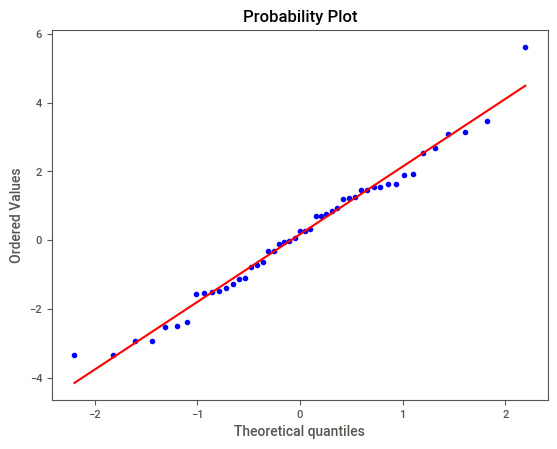

In [121]:
# Relembrando outra forma de observar a normalidade

stats.probplot(df_analise.diff_sex_seg, dist="norm", plot=pylab)
pylab.show()

**Vamos finalmente ao nosso teste estatístico**

*Pergunta: a média dos retornos da segunda-feira é estatisticamente menor que a média dos retornos da sexta-feira que a precede?*

* Hipótese H0 (nula): A média dos retornos das segundas feiras <u>será igual estatisticamente</u> à média da sextas feiras que as precederam.
* Hipótese H1 (alternativa): As médias dos retornos <u>serão diferentes</u> estatisticamente

In [122]:
# Podemos concluir que as médias não diferem, não corroborando a teoria de que existiu um 'weekend effect' para o IBOV no ano de 2022

stats.ttest_rel(df_analise.Monday, df_analise.Friday)

TtestResult(statistic=-0.6062748057855685, pvalue=0.5471889803488991, df=48)

---
### **5.5. ANOVA de Medidas Repetidas**


Você provavelmente já ouviu a expressão "*Sell in May and go away!*", que em uma tradução literal seria algo como "*Venda em maio e vá embora!*". O fato é que além de uma rima legal, essa expressão traz um contexto de sazonalidade de mercado muito interessante e que, sem dúvida, merece nossa atenção.

Aqui o raciocínio será similar ao do teste T pareado, onde os dados apresentam uma dependencia temporal. Desta vez, teremos mais de 2 grupos e por isso usaremos a Anova de medidas repetidas. O aninhamento (dependencia) será entre os meses de um mesmo ano (teremos 12 grupos). Veja que eu não poderia comparar março de 2022 com abril de 2001 por ex.

<center><img src = "https://snbchf.com/wp-content/uploads/2017/05/Sell_in_May.png" width = "500">



**Um pouco mais de curiosidade sobre nosso case:**

Estudos mostram que a expressão original é ainda mais curiosa: "*Sell in May, go away, and come back on St. Leger’s Day*" = Venda em maio, vá embora e volte no dia de 'Saint Leger' (15 de setembro). A estratégia envolve o lucro a partir na sazonalindade anual do mercado. Basicamente, você venderia todas as suas ações em maio, quando o mercado historicamente apresenta um desempenho abaixo do esperado. No mesmo ano, entre outubro e novembro, você os compra novamente, quando o mercado de ações começa a subir novamente.

Nosso objetivo será testar se os retornos mensais do IBOV diferem estatisticamente entre si, buscando detectar o padrão "Sell in May and go away" desde os anos 2000:

* Hipótese H0 (nula): As médias dos retornos mensais <u>são iguais estatisticamente</u> entre os meses do ano
* Hipótese H1 (alternativa): As médias <u>são diferentes</u> estatisticamente

[Clique aqui para acessar a seção de importação e instalação de bibliotecas](#importar)

In [168]:
ibov_ohlc = yf.download('^BVSP', period='max', interval='1d', multi_level_index=False)

ibov_ohlc.head()

[*********************100%***********************]  1 of 1 completed


,Close,High,Low,Open,Volume
Date,,,,,
1993-04-27,24.500000,25.400000,24.500000,24.799999,0
1993-04-28,24.299999,24.600000,23.700001,24.500000,0
1993-04-29,23.700001,24.799999,23.700001,24.299999,0
1993-04-30,24.100000,24.200001,23.700001,23.700001,0
1993-05-03,24.100000,24.400000,23.799999,24.100000,0


In [169]:
# Futuramente 'M' não será mais usado e sim o 'ME'

ibov_ohlc = ibov_ohlc.resample('ME').agg({"Open": "first", "High": "max", "Low": "min", "Close": "last"})

In [170]:
ibov_ohlc.head()

,Open,High,Low,Close
Date,,,,
1993-04-30,24.799999,25.400000,23.700001,24.100000
1993-05-31,24.100000,35.599998,23.799999,34.900002
1993-06-30,35.400002,54.799999,35.400002,53.700001
1993-07-31,53.700001,67.400002,51.700001,65.599998
1993-08-31,65.599998,100.099998,60.599998,96.400002


In [171]:
ibov_ohlc['Resultado_mes'] = (ibov_ohlc['Close'].pct_change()*100).round(2)

In [172]:
ibov_ohlc.head()

,Open,High,Low,Close,Resultado_mes
Date,,,,,
1993-04-30,24.799999,25.400000,23.700001,24.100000,NaN
1993-05-31,24.100000,35.599998,23.799999,34.900002,44.81
1993-06-30,35.400002,54.799999,35.400002,53.700001,53.87
1993-07-31,53.700001,67.400002,51.700001,65.599998,22.16
1993-08-31,65.599998,100.099998,60.599998,96.400002,46.95


In [173]:
# Organizar os dados para que eu tenha uma coluna com os retornos mensais, com os meses e os anos da série temporal (23 anos)

ibov_ohlc["Mes"] = ibov_ohlc.index.month_name()
ibov_ohlc["Ano"] = ibov_ohlc.index.year
ibov_ohlc["Mes_num"] = ibov_ohlc.index.strftime('%m')
ibov_ohlc = ibov_ohlc.loc['2000':'2022']
ibov_ohlc

,Open,High,Low,Close,Resultado_mes,Mes,Ano,Mes_num
Date,,,,,,,,
2000-01-31,17098.0,18099.0,15350.0,16388.0,-4.12,January,2000,01
2000-02-29,16389.0,18886.0,16389.0,17660.0,7.76,February,2000,02
2000-03-31,17668.0,19047.0,16922.0,17820.0,0.91,March,2000,03
2000-04-30,17826.0,17826.0,14029.0,15538.0,-12.81,April,2000,04
2000-05-31,15596.0,15944.0,13556.0,14957.0,-3.74,May,2000,05
...,...,...,...,...,...,...,...,...
2022-08-31,103165.0,114375.0,101694.0,109523.0,6.16,August,2022,08
2022-09-30,109524.0,114392.0,106244.0,110037.0,0.47,September,2022,09
2022-10-31,110048.0,120752.0,110048.0,116037.0,5.45,October,2022,10


In [174]:
# Consigo visualizar as médias mensais dos retornos ao longo dos 23 anos de cobertura
# Colocamos uma formatação condicional para diferenciar meses com médias positivas de negativas

# Futuramente não serão mais usadas algumas estruturas como o código antigo abaixo
#resultado_geral = pd.pivot_table(ibov_ohlc, values="Resultado_mes", index=["Mes_num"], columns=[], aggfunc=np.mean)
#resultado_geral = resultado_geral.style.format('{:.3f}', na_rep="").applymap(lambda x: 'background-color : #81b585' if x>0 else 'background-color : #cf7a7a')

# Código Atualizado 
# uso de apenas 'mean' em vez de 'np.mean'
resultado_geral = pd.pivot_table(ibov_ohlc, values="Resultado_mes", index=["Mes_num"], aggfunc="mean")
# A função 'applymap' foi mudada para 'map'
# Neste plot foi acrescentado o ';color:' após o 'background-color'
resultado_geral = resultado_geral.style.format('{:.3f}', na_rep="").map(lambda x: 'background-color: #81b585; color: green' if x > 0 else 'background-color: #cf7a7a; color: red')

resultado_geral

,Resultado_mes
Mes_num,
01,0.808
02,1.170
03,0.190
04,1.507
05,-0.910
06,-0.785
07,1.692
08,1.140
09,-0.815


Agora pra ter uma visão geral dos meses ao longo da série histórica

In [175]:
# Novamente, usando uma tabela dinâmica, porém com duas categorias de agrupamento (matriz): Ano em linhas e Mês em colunas
# Nesse caso, o parametro usado no argumento aggfunc não importa já que é um valor apenas (poderia ser media, mediana, max...)
# De fato parece q alguns meses como maio são realmente mais "negativos"

# Neste plot foi acrescentado o ';color:' após o 'background-color'
resultados_pontuais = pd.pivot_table(ibov_ohlc, values="Resultado_mes", index=["Ano",], columns=["Mes_num"], aggfunc='mean')
resultados_pontuais = resultados_pontuais.style.format('{:.3f}', na_rep="").map(lambda x: 'background-color : #81b585; color: green' if x>0 else 'background-color : #cf7a7a; color: red')
resultados_pontuais

Mes_num,01,02,03,04,05,06,07,08,09,10,11,12
Ano,,,,,,,,,,,,
2000,-4.120,7.760,0.910,-12.810,-3.740,11.840,-1.630,5.420,-8.180,-6.660,-10.630,14.840
2001,15.820,-10.080,-9.140,3.320,-1.800,-0.610,-5.540,-6.640,-17.170,6.850,13.790,5.000
2002,-6.310,10.310,-5.540,-1.280,-1.710,-13.390,-12.350,6.340,-16.940,17.920,3.350,7.220
2003,-2.900,-6.030,9.660,11.380,6.890,-3.350,4.620,11.800,5.520,12.310,12.250,10.170
2004,-1.730,-0.440,1.780,-11.450,-0.320,8.210,5.620,2.090,1.940,-0.830,9.010,4.250
2005,-7.040,15.560,-5.430,-6.640,1.460,-0.620,3.960,7.690,12.620,-4.400,5.710,4.820
2006,14.730,0.590,-1.700,6.350,-9.500,0.280,1.220,-2.280,0.600,7.720,6.800,6.060
2007,0.380,-1.680,4.360,6.880,6.770,4.060,-0.380,0.840,10.670,8.030,-3.540,1.400
2008,-6.880,6.720,-3.970,11.320,6.960,-10.430,-8.480,-6.430,-11.030,-24.800,-1.770,2.610


**Normalidade dos dados por grupo**

In [176]:
# Vamos checar a premissa de normalidade dos dados de cada grupo
# Dessa vez usaremos um groupby um pouco mais complexo, incluindo uma função lambda
# Basicamente agrupar os dados de retornos por mes e aplicar a função do teste de normalidade, retornando apenas o p valor

pvalor_normalidade = ibov_ohlc[['Mes_num','Resultado_mes']].groupby('Mes_num').agg(lambda x: stats.normaltest(x).pvalue)
pvalor_normalidade

,Resultado_mes
Mes_num,
01,0.137649
02,0.685920
03,0.000082
04,0.754882
05,0.640768
06,0.901192
07,0.534325
08,0.512283
09,0.494974


Veja que março e outubro foram os únicos meses sem apresentar normalidade dos dados.

Basicamente devido a duas grandes crises: março devido ao resultado de 2020 Covid (-29.90) e outubro 2008 crise subprimes (-24.80)

In [177]:
# Filtrar os dados de março e ver se retirando o dado de 2020 (Covid) os dados apresentam distribuição normal

mar = ibov_ohlc[ibov_ohlc.Mes=='March']
stats.normaltest(mar[mar.Ano!=2020]['Resultado_mes'])

NormaltestResult(statistic=2.720223565943761, pvalue=0.25663208825262684)

In [178]:
# Filtrar os dados de outubro e ver se retirando o dado de 2008 (Subprimes) os dados apresentam distribuição normal

out = ibov_ohlc[ibov_ohlc.Mes=='October']
stats.normaltest(out[out.Ano!=2008]['Resultado_mes'])

NormaltestResult(statistic=0.5791453964548765, pvalue=0.7485833702485929)

OBS: Como temos 23 repetições, vamos optar por filtrar esses dois anos onde tivemos as duas maiores crises econômicas desse século. Uma solução seria transformar os dados ou usar um teste não paramétrico (de mediana e não de média).

Mas deixaremos esses passos para um outro momento.

In [179]:
# Outra forma de filtro, dessa vez retirando os anos de 2008 e 2020 para todos os meses

ibov_ohlc_sem_crises = ibov_ohlc[~ibov_ohlc.Ano.isin([2008,2020])]
ibov_ohlc_sem_crises

,Open,High,Low,Close,Resultado_mes,Mes,Ano,Mes_num
Date,,,,,,,,
2000-01-31,17098.0,18099.0,15350.0,16388.0,-4.12,January,2000,01
2000-02-29,16389.0,18886.0,16389.0,17660.0,7.76,February,2000,02
2000-03-31,17668.0,19047.0,16922.0,17820.0,0.91,March,2000,03
2000-04-30,17826.0,17826.0,14029.0,15538.0,-12.81,April,2000,04
2000-05-31,15596.0,15944.0,13556.0,14957.0,-3.74,May,2000,05
...,...,...,...,...,...,...,...,...
2022-08-31,103165.0,114375.0,101694.0,109523.0,6.16,August,2022,08
2022-09-30,109524.0,114392.0,106244.0,110037.0,0.47,September,2022,09
2022-10-31,110048.0,120752.0,110048.0,116037.0,5.45,October,2022,10


In [180]:
# Vemos que agora todos os dados estão normais

pvalor_normalidade = ibov_ohlc_sem_crises[['Mes_num','Resultado_mes']].groupby('Mes_num').agg(lambda x: stats.normaltest(x).pvalue)
pvalor_normalidade

,Resultado_mes
Mes_num,
01,0.111705
02,0.446556
03,0.313153
04,0.979249
05,0.759374
06,0.776575
07,0.459188
08,0.741196
09,0.364258


**Teste de Levene (homocedasticidade)**

In [181]:
# Aplicando os filtros no dataframe (query) para Teste de Levene (homocedasticidade)

jan = ibov_ohlc_sem_crises.query("Mes in 'January'")['Resultado_mes']
fev = ibov_ohlc_sem_crises.query("Mes in 'February'")['Resultado_mes']
mar = ibov_ohlc_sem_crises.query("Mes in 'March'")['Resultado_mes']
abr = ibov_ohlc_sem_crises.query("Mes in 'April'")['Resultado_mes']
mai = ibov_ohlc_sem_crises.query("Mes in 'May'")['Resultado_mes']
jun = ibov_ohlc_sem_crises.query("Mes in 'June'")['Resultado_mes']
jul = ibov_ohlc_sem_crises.query("Mes in 'July'")['Resultado_mes']
ago = ibov_ohlc_sem_crises.query("Mes in 'August'")['Resultado_mes']
setem = ibov_ohlc_sem_crises.query("Mes in 'September'")['Resultado_mes'] # set já é uma palavra reservada no python
out = ibov_ohlc_sem_crises.query("Mes in 'October'")['Resultado_mes']
nov = ibov_ohlc_sem_crises.query("Mes in 'November'")['Resultado_mes']
dez = ibov_ohlc_sem_crises.query("Mes in 'December'")['Resultado_mes']

In [182]:
# Assim como no teste de normalidade, H0 é de que as variâncias são homogenêas

stats.levene(jan, fev, mar, abr, mai, jun, jul, ago, setem, out, nov, dez)

LeveneResult(statistic=0.6898841360552501, pvalue=0.7477267667720155)

**Chegamos ao código da ANOVA de medidas repetidas**



Precisaremos de uma outra biblioteca para executar a Anova de medidas repetidas e depois o teste post hoc pairwise

[Clique aqui para acessar a seção de importação e instalação de bibliotecas](#importar)

Retomando...  *Nosso objetivo será testar se os retornos mensais do IBOV diferem estatisticamente entre si, buscando detectar o padrão "Sell in May and go away" desde os anos 2000:*

* Hipótese H0 (nula): As médias dos retornos mensais são iguais estatisticamente entre os meses do ano
* Hipótese H1 (alternativa): As médias são diferentes estatisticamente

In [185]:
# dv será nossa variável resposta, no caso, retornos mensais
# subject indica o fator de dependencia, nosso caso o Ano
# within indica nossos grupos a serem comparados (passado como lista, se dois itens teríamos uma "two way anova de medidas repetidas")

anova_medidas_rep = pg.rm_anova(data=ibov_ohlc_sem_crises, dv='Resultado_mes', within='Mes', subject='Ano', detailed=True)
anova_medidas_rep

,Source,SS,DF,MS,F,p-unc,ng2,eps
0,Mes,528.274852,11,48.024987,1.142335,0.329546,0.048631,0.623794
1,Error,9249.039556,220,42.041089,NaN,NaN,NaN,NaN


Observe o p valor (p-unc) = 0.329

**Não rejeitamos H0, as médias dos retornos entre os meses não diferem significativamente**

Se observarmos, o MS (do ingles mean square, ou quadrado médio) é próximo entre os grupos (Mes) e entre o Erro (dentro dos grupos).

Ele representa a variância distribuida entre grupos x dentro dos grupos.

A ANOVA em geral se baseará nessa diferença (cálculo do F e consequentemente do p).

Quando minha variação entre grupos foi bem maior que dentro dos grupos, teremos um resultado significativo.

Veja que essa variação é realmente muito alta dentro dos meses

In [186]:
# Tabela dinâmica com a média e erro padrão da média para jogar na figura

dados_media = ibov_ohlc_sem_crises[['Mes_num','Resultado_mes']].groupby(['Mes_num']).mean()
dados_sem = ibov_ohlc_sem_crises[['Mes_num','Resultado_mes']].groupby(['Mes_num']).std()
dados_figura = pd.concat([dados_media, dados_sem], axis=1)
dados_figura.columns = ['Media_retornos', 'SEM_retornos']

fig = go.Figure()

fig.add_trace(go.Bar(name='Retornos', x=dados_figura.index, y=dados_figura.Media_retornos,
                     error_y=dict(type='data', array=dados_figura.SEM_retornos),
                     marker_color='orange', orientation='v'))

fig.update_layout(title_text='<b>Retornos mensais do IBOV</b> (média \xB1 desvio padrão) <br><b>desde 2000', xaxis_title= '<b>Mês',
                  yaxis_title= '<b>Retorno médio mensal (%)', template="none", margin=dict(l=75, r=20, t=75, b=75),
                  paper_bgcolor="#f7f8fa", font=dict(family="Arial", size=13, color="black"), width=800, height=400)

fig.show()

---
**Mas aqui um ponto muito importante, que acaba sendo uma limitação dos testes
de grupos como ANOVA**

E esse é um detalhe interessante, que mostra que dados reais muitas vezes são mais complexos que os exemplos "bonitinhos" dos livros

**Observe o seguinte: rodaremos o teste post-hoc mesmo não tendo ANOVA significativa**

In [192]:
# A função 'pairwise_ttests' será descontinuada. Código antigo:
#df_post_hoc = pg.pairwise_ttests(data=ibov_ohlc_sem_crises, dv='Resultado_mes', within='Mes', subject='Ano')

# Código atualizado
df_post_hoc = pg.pairwise_tests(data=ibov_ohlc_sem_crises, dv='Resultado_mes', within='Mes', subject='Ano')
df_post_hoc

,Contrast,A,B,Paired,Parametric,T,dof,alternative,p-unc,BF10,hedges
0,Mes,April,August,True,True,-0.507392,20.0,two-sided,0.617430,0.256,-0.164146
1,Mes,April,December,True,True,-1.000854,20.0,two-sided,0.328854,0.355,-0.333312
2,Mes,April,February,True,True,-0.307803,20.0,two-sided,0.761415,0.237,-0.106481
3,Mes,April,January,True,True,-0.300269,20.0,two-sided,0.767071,0.237,-0.086911
4,Mes,April,July,True,True,-0.608646,20.0,two-sided,0.549610,0.269,-0.180538
...,...,...,...,...,...,...,...,...,...,...,...
61,Mes,May,October,True,True,-2.604393,20.0,two-sided,0.016965,3.257,-0.828754
62,Mes,May,September,True,True,-0.745469,20.0,two-sided,0.464660,0.292,-0.209492
63,Mes,November,October,True,True,-1.466044,20.0,two-sided,0.158183,0.576,-0.391340
64,Mes,November,September,True,True,0.594666,20.0,two-sided,0.558735,0.267,0.181359


Como temos muitas linhas, vamos filtrar caso haja alguma com p <0.05

In [188]:
df_post_hoc[df_post_hoc['p-unc']<0.05]

,Contrast,A,B,Paired,Parametric,T,dof,alternative,p-unc,BF10,hedges
17,Mes,August,May,True,True,2.306572,20.0,two-sided,0.031910,1.95,0.568420
24,Mes,December,June,True,True,2.268368,20.0,two-sided,0.034533,1.83,0.607677
26,Mes,December,May,True,True,2.643939,20.0,two-sided,0.015570,3.496,0.758407
56,Mes,March,May,True,True,2.102906,20.0,two-sided,0.048336,1.402,0.562934
61,Mes,May,October,True,True,-2.604393,20.0,two-sided,0.016965,3.257,-0.828754


E surpreendentemente vemos que mesmo com p valor da ANOVA > 0.05, quando rodamos os testes par a par (pairwise) encontramos alguns pares significativos.

Observe que isso ocorre principalmente com o mes de Maio vs outro meses mais positivos. Embora raras, essas divergencias entre testes acabam acontecendo, principalmente quando você tem muitos grupos (no nosso caso 12)

Vamos rodar outra Anova, dessa vez com apenas 4 meses (4 grupos)

In [189]:
from statsmodels.stats.anova import AnovaRM

# depvar será nossa variável resposta, no caso, retornos mensais
# subject indica o fator de dependencia, nosso caso o Ano
# within indica nossos grupos a serem comparados (passado colo lista, se dois itens teríamos uma "two way anova de medidas repetidas")

df_ANOVA = pg.rm_anova(data=ibov_ohlc_sem_crises.query("Mes in ['March', 'May', 'October', 'December']"), dv='Resultado_mes', within='Mes', subject='Ano', detailed=True)
df_ANOVA

,Source,SS,DF,MS,F,p-unc,ng2,eps
0,Mes,366.996613,3,122.332204,3.21625,0.029022,0.109497,0.924634
1,Error,2282.139562,60,38.035659,NaN,NaN,NaN,NaN


Temos um resultado que mostra que as médias dos retornos são diferentes entre os 4 meses

**Com essa aula, encerramos os testes de comparação de médias.**

**Agora é com vocês, exercitem os testes com cases reais do mercado e compartilhem conosco!!**

## **6. Correlação**

##### **6.1. Conceitos**

Observe a imagem a seguir. Que conclusões você consegue tirar a respeito do comportamento do IBOV e dos juros (SELIC)?

<center><img src = "https://github.com/victorncg/financas_quantitativas/blob/main/Imagens/SELIC%20IBOV.png?raw=true" width = "700">

**Correlação**

De forma geral, uma medida da interdependência entre dados.

O conceito pode incluir mais de duas variáveis. O termo é mais comumente usado em um sentido mais estrito para exprimir a relação entre variáveis quantitativas.

Embora o termo "correlação" possa indicar qualquer tipo de associação, na estatística ele se refere normalmente ao quanto duas variáveis estão linearmente relacionadas.

**Importante:** A presença de correlação não é suficiente para inferir a presença de uma relação causal (correlação não implica em causa).

Como a correlação de duas variáveis pode ser verificada visualmente na prática?

Existem diversos coeficientes de correlação (métricas que denotam a magnitude da correlação entre duas variáveis)

##### **6.2. Obtendo dados a partir do Yahoo Finance**

[Clique aqui para acessar a seção de importação e instalação de bibliotecas](#importar)

In [456]:
lista_ativos = ['^BVSP', '^GSPC']

dados_ibov_sp500 = yf.download(lista_ativos, start='2000-01-01', end='2022-08-27', multi_level_index=False)['Close']

[*********************100%***********************]  2 of 2 completed


In [457]:
dados_ibov_sp500.head()

Ticker,^BVSP,^GSPC
Date,,
2000-01-03,16930.0,1455.219971
2000-01-04,15851.0,1399.420044
2000-01-05,16245.0,1402.109985
2000-01-06,16107.0,1403.449951
2000-01-07,16309.0,1441.469971


In [458]:
dados_ibov_sp500.to_csv('S&P_IBOV.csv')

##### **6.3. Obtenção dos dados a partir do .csv**

**Opcional** (execute apenas se o Yahoo Finance não estiver funcionando)

In [459]:
dados_ibov_sp500 = pd.read_csv('S&P_IBOV.csv')

In [460]:
dados_ibov_sp500 = dados_ibov_sp500.set_index('Date',drop=True)

##### **6.4. Correlação de Pearson**

A métrica mais comum de correlação é o Coeficiente de Pearson, que é sensível apenas a relações lineares entre duas variáves.

Existem outros coeficientes de correlação mais robustos que o de Pearson, ou seja, mais sensíveis a relações não lineares entre as variáveis.



<center><img src = "https://upload.wikimedia.org/wikipedia/commons/d/d4/Correlation_examples2.svg" width = "900">

Correlação da população



<center><img src = "https://wikimedia.org/api/rest_v1/media/math/render/svg/f76ccfa7c2ed7f5b085115086107bbe25d329cec" width = "400">

Correlação de uma amostra



<center><img src = "https://wikimedia.org/api/rest_v1/media/math/render/svg/2b9c2079a3ffc1aacd36201ea0a3fb2460dc226f" width = "700">

O Coeficiente de Pearson é uma medida da relação linear entre dois conjuntos de dados.

É a razão entre a covariância das duas variáveis e o produto dos seus desvio-padrão, assim, é essencialmente uma medida normalizada da covariância, de tal forma que sempre tem um valor entre -1 e 1.


Da mesma forma que acontece com a covariância, este coeficiente consegue apenas refletir uma relação linear entre as variáveis, e acaba ignorando muitos outros tipos de relações.

##### **6.5. Explorando os dados**

In [461]:
dados_ibov_sp500.head()

,^BVSP,^GSPC
Date,,
2000-01-03,16930.0,1455.219971
2000-01-04,15851.0,1399.420044
2000-01-05,16245.0,1402.109985
2000-01-06,16107.0,1403.449951
2000-01-07,16309.0,1441.469971


<Axes: xlabel='Date'>

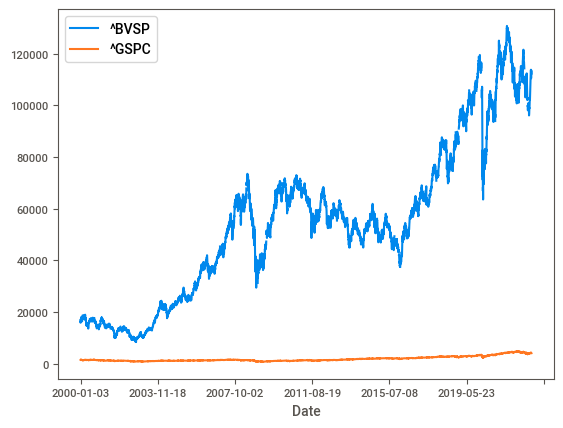

In [462]:
dados_ibov_sp500.plot()

In [463]:

# A função size não faz parte do px.line. Código antigo:
#fig = px.line(dados_ibov_sp500, x=dados_ibov_sp500.index, y=dados_ibov_sp500.columns[0:2], size(15,8))

fig = px.line(dados_ibov_sp500, x=dados_ibov_sp500.index, y=dados_ibov_sp500.columns[0:2])

fig.show();

In [464]:
dados_normalizados = dados_ibov_sp500/dados_ibov_sp500.iloc[0]

In [465]:
dados_normalizados.head()

,^BVSP,^GSPC
Date,,
2000-01-03,1.000000,1.000000
2000-01-04,0.936267,0.961655
2000-01-05,0.959539,0.963504
2000-01-06,0.951388,0.964425
2000-01-07,0.963320,0.990551


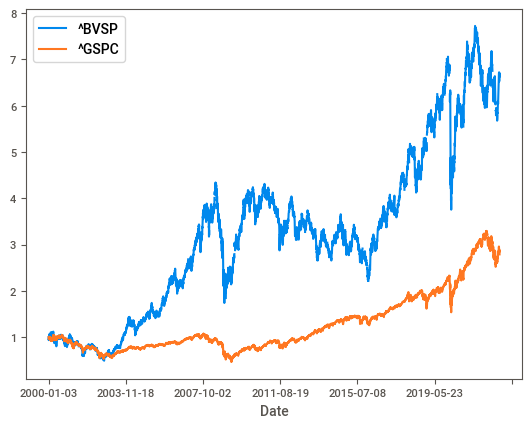

In [466]:
dados_normalizados.plot();

In [467]:
fig = px.line(dados_normalizados, x=dados_normalizados.index, y=dados_normalizados.columns[0:2])

fig.show();

In [468]:
# Código antigo
#result_ibov_sp500 = dados_normalizados.pct_change()

# Atualização:
# Futuramente deve explicitar o método que os dados serão preenchidos antes de usar o pct_change.
# Por default o pct_change usa o fill_method='pad', mas não terá mais esse argumento na função pct_change.
result_ibov_sp500 = dados_normalizados.ffill()
result_ibov_sp500 = dados_normalizados.pct_change()
result_ibov_sp500.head()

C:\Users\bague\AppData\Local\Temp\ipykernel_21336\1015573403.py:8: FutureWarning:

The default fill_method='pad' in DataFrame.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.



,^BVSP,^GSPC
Date,,
2000-01-03,NaN,NaN
2000-01-04,-0.063733,-0.038345
2000-01-05,0.024856,0.001922
2000-01-06,-0.008495,0.000956
2000-01-07,0.012541,0.027090


In [469]:
result_ibov_sp500.dropna(inplace=True)

In [470]:
result_ibov_sp500

,^BVSP,^GSPC
Date,,
2000-01-04,-0.063733,-0.038345
2000-01-05,0.024856,0.001922
2000-01-06,-0.008495,0.000956
2000-01-07,0.012541,0.027090
2000-01-10,0.043718,0.011190
...,...,...
2022-08-22,-0.008924,-0.021400
2022-08-23,0.021321,-0.002238
2022-08-24,0.000363,0.002916


##### **6.6. Gráficos de dispersão (scatterplot)**

In [471]:
fig = px.scatter(x=result_ibov_sp500['^GSPC'], y=result_ibov_sp500['^BVSP'],
                 template='simple_white', width=400, height=400)
fig.update_layout(paper_bgcolor="#f7f8fa", margin=dict(l=20, r=20, t=20, b=20))
fig.show()

In [472]:
stats.pearsonr(result_ibov_sp500['^BVSP'], result_ibov_sp500['^GSPC'])

PearsonRResult(statistic=0.5955313234867149, pvalue=0.0)

In [473]:
corr, p = stats.pearsonr(result_ibov_sp500['^BVSP'], result_ibov_sp500['^GSPC'])

print('Correlação de Pearson, r=%.3f' %corr, 'p=%.8f' %p)

Correlação de Pearson, r=0.596 p=0.00000000


In [474]:
def testa_cor_par(acao1, acao2):

  dados = yf.download([acao1, acao2], start='2019-01-01', end='2022-08-27')['Close']

  dados_normalizados = dados/dados.iloc[0]

  retornos_diarios = dados_normalizados.pct_change()

  retornos_diarios.dropna(inplace=True)

  fig = px.scatter(x=retornos_diarios[acao1], y=retornos_diarios[acao2],
                  template='simple_white', width=400, height=400)
  fig.update_layout(paper_bgcolor="#f7f8fa", margin=dict(l=20, r=20, t=20, b=20))

  fig.show()

In [475]:
testa_cor_par('LREN3.SA', 'PRIO3.SA')

[*********************100%***********************]  2 of 2 completed


In [476]:
testa_cor_par('WEGE3.SA', 'PETR4.SA')

[*********************100%***********************]  2 of 2 completed


In [477]:
testa_cor_par('PRIO3.SA', 'PETR4.SA')

[*********************100%***********************]  2 of 2 completed


##### **6.7. Casos com outliers**

Imagine agora uma situação onde temos um outlier. Sabemos que AMER3 apresentava uma boa correlação com o IBOV até o dia em que a fraude contábil foi divulgada

In [478]:
lista_ativos = ['^BVSP', 'AMER3.SA']

dados = yf.download(lista_ativos, start='2022-11-20', end='2023-01-13')['Close']
dados_retornos = dados.pct_change()*100
dados_retornos = dados_retornos.dropna()
dados_retornos.tail()

[*********************100%***********************]  2 of 2 completed


Ticker,AMER3.SA,^BVSP
Date,,
2023-01-06,7.430341,1.225841
2023-01-09,6.436119,0.359256
2023-01-10,7.490975,1.542659
2023-01-11,0.755668,0.767275
2023-01-12,-77.333333,0.102002


Vejamos os dados de novembro até o dia da notícia. Vemos que se ignorarmos o outlier, é bem fácil observar uma correlação positiva entre os dois ativos

In [479]:
fig = px.scatter(x=dados_retornos['^BVSP'], y=dados_retornos['AMER3.SA'],
                 template='simple_white', width=400, height=400)
fig.update_layout(paper_bgcolor="#f7f8fa", margin=dict(l=20, r=20, t=20, b=20))
fig.show()

In [480]:
corr, p = stats.pearsonr(dados_retornos['AMER3.SA'], dados_retornos['^BVSP'])
print('Correlação de Pearson, r=%.3f' %corr, 'p=%.3f' %p)

Correlação de Pearson, r=0.286 p=0.086


In [481]:
corr, p = stats.spearmanr(dados_retornos['AMER3.SA'], dados_retornos['^BVSP'])
print('Correlação de Spearman, r=%.3f' %corr, 'p=%.3f' %p)

Correlação de Spearman, r=0.740 p=0.000


De um resultado não significativo (p<0.05) passamos a ter uma correlação muito forte (r=0.74)

##### **6.8. Correlação de Spearman**

Quando isso acontece, o que devemos fazer?

É por isso que introduziremos um outro coeficiente de correlação, de Spearman

A correlação de Spearman é uma medida de correlação rankeada (dependência estatística entre os rankings de duas variáveis) não-paramétrica.

Avalia o quanto uma relação de duas varáveis pode ser descrita por uma função monotônica.

A correlação de Spearman de duas varáveis é igual a correlação de Pearson entre os valores rankeados destas duas variáveis.

Enquanto a correlação de Pearson avalia relações lineares, a correlação de Spearman avalia relações monotônicas (lineares ou não).

Se não há dados repetidos, uma correlação Spearman nos valores de +1 ou -1 ocorre quando cada uma das variáveis é uma função monotônica perfeita da outra.

<center><img src = "https://miro.medium.com/v2/resize:fit:720/format:webp/1*9-V2iljnY1aM6OgVxHneVg.png" width = "700">

A correlação de Spearman é menos sensível do que a correlação de Pearson a outliers que se localizam nas caudas das distribuições das duas variáveis. Isso é porque a de Spearman limita o outlier ao valor da sua posição no ranking.

##### **6.9. IBOV vs. Selic**

In [482]:
# Foi inserido boas práticas para ler o arquivo

# Caminho atual do projeto
base_path = os.getcwd()
# Caminho completo do arquivo
file_path_selic = os.path.join(base_path, "Meus Arquivos", 'selic.csv')

pd.read_csv(file_path)

,Date,Value
0,2000-01-01,19.00
1,2000-01-02,19.00
2,2000-01-03,19.00
3,2000-01-04,19.00
4,2000-01-05,19.00
...,...,...
8396,2022-12-27,13.75
8397,2022-12-28,13.75
8398,2022-12-29,13.75
8399,2022-12-30,13.75


In [483]:
selic = pd.read_csv(file_path_selic, index_col='Date', parse_dates= True)

In [484]:
dados_ibov_sp500.head()

,^BVSP,^GSPC
Date,,
2000-01-03,16930.0,1455.219971
2000-01-04,15851.0,1399.420044
2000-01-05,16245.0,1402.109985
2000-01-06,16107.0,1403.449951
2000-01-07,16309.0,1441.469971


In [485]:
# Devemos transformar o index 'Date' de dados_ibov_sp500 para o tipo datetime
dados_ibov_sp500.index = pd.to_datetime(dados_ibov_sp500.index)

full = pd.merge(selic, dados_ibov_sp500, how = 'inner', on = 'Date' )

In [486]:
full.head()

,Value,^BVSP,^GSPC
Date,,,
2000-01-03,19.0,16930.0,1455.219971
2000-01-04,19.0,15851.0,1399.420044
2000-01-05,19.0,16245.0,1402.109985
2000-01-06,19.0,16107.0,1403.449951
2000-01-07,19.0,16309.0,1441.469971


In [487]:
full.rename(columns = {'^BVSP': 'IBOV', 'Value':'SELIC', '^GSPC':'S&P500'}, inplace = True)

In [488]:
full.head()

,SELIC,IBOV,S&P500
Date,,,
2000-01-03,19.0,16930.0,1455.219971
2000-01-04,19.0,15851.0,1399.420044
2000-01-05,19.0,16245.0,1402.109985
2000-01-06,19.0,16107.0,1403.449951
2000-01-07,19.0,16309.0,1441.469971


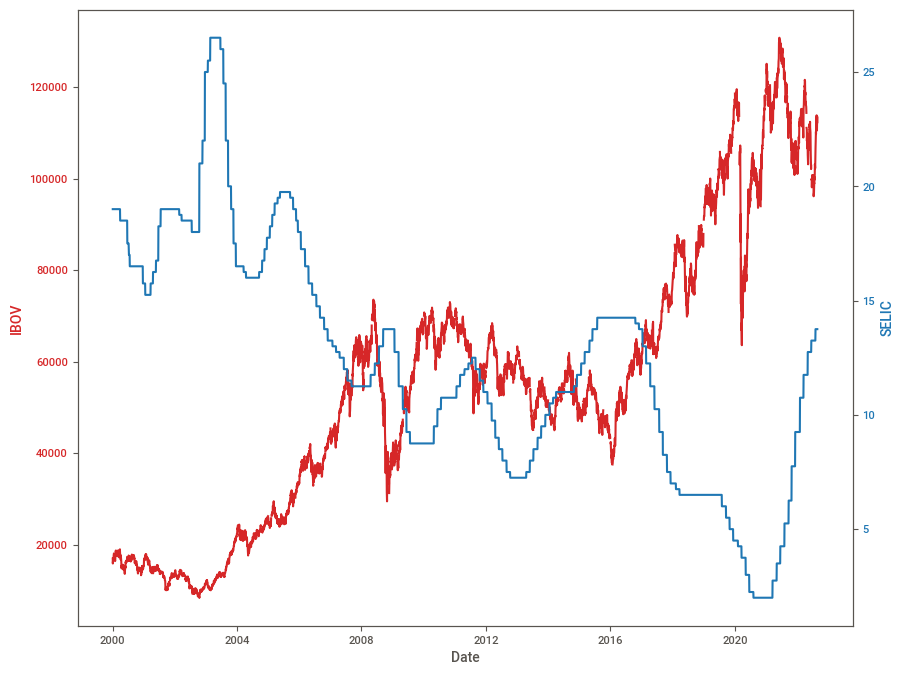

In [489]:
fig, ax1 = plt.subplots(figsize = (10,8))

color = 'tab:red'
ax1.set_xlabel('Date')
ax1.set_ylabel('IBOV', color=color)
ax1.plot(full.IBOV, color=color)
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx() # Configurar um outro eixo vertical que compartilha o mesmo eixo X

color = 'tab:blue'
ax2.set_ylabel('SELIC', color=color)
ax2.plot(full.SELIC, color=color)
ax2.tick_params(axis='y', labelcolor=color)

plt.show()

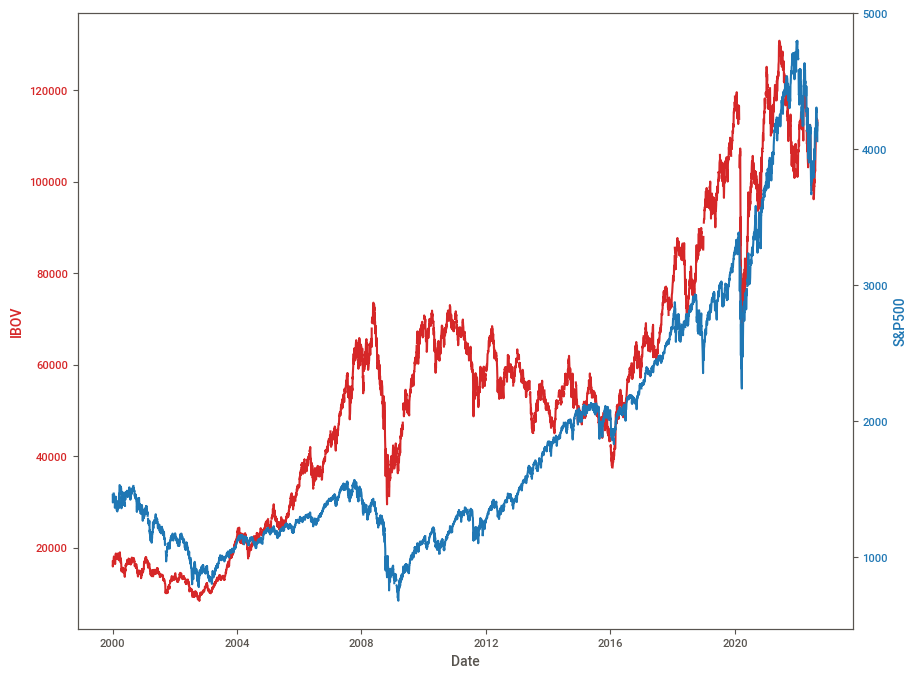

In [490]:
fig, ax1 = plt.subplots(figsize = (10,8))

color = 'tab:red'
ax1.set_xlabel('Date')
ax1.set_ylabel('IBOV', color=color)
ax1.plot(full.IBOV, color=color)
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx() # Configurar um outro eixo vertical que compartilha o mesmo eixo X

color = 'tab:blue'
ax2.set_ylabel('S&P500', color=color)
ax2.plot(full['S&P500'], color=color)
ax2.tick_params(axis='y', labelcolor=color)

plt.show()

##### **6.10. Mapa de calor de correlações**

In [491]:
dados_ativos = yf.download(['PETR3.SA','RADL3.SA', 'OIBR3.SA','KNRI11.SA','FLMA11.SA','BOVA11.SA',
          'SMAL11.SA','AAPL34.SA','IVVB11.SA','PETR4.SA','WEGE3.SA','SUZB3.SA','CSAN3.SA','VALE3.SA'], start='2017-01-01')['Close']
dados_ativos.head()

[*********************100%***********************]  14 of 14 completed


Ticker,AAPL34.SA,BOVA11.SA,CSAN3.SA,FLMA11.SA,IVVB11.SA,KNRI11.SA,OIBR3.SA,PETR3.SA,PETR4.SA,RADL3.SA,SMAL11.SA,SUZB3.SA,VALE3.SA,WEGE3.SA
Date,,,,,,,,,,,,,,
2017-01-02,4.381739,57.630001,7.535225,87.736710,78.639999,112.051849,197.021103,5.218450,4.362676,10.799407,54.000000,17.149132,14.397563,5.134757
2017-01-03,4.335370,59.750000,7.886126,88.922333,76.250000,111.980530,197.767395,5.549930,4.612652,11.212643,55.450001,17.149132,15.035288,5.393194
2017-01-04,4.320302,59.750000,7.890182,88.922333,75.940002,113.344383,195.528519,5.483635,4.612652,11.054120,56.990002,17.149132,14.765260,5.263976
2017-01-05,4.344644,60.049999,7.875983,88.527107,75.260002,113.391975,199.259979,5.606756,4.687050,10.888469,56.990002,17.149132,15.328296,5.250371
2017-01-06,4.368988,59.849998,7.693436,88.922333,76.300003,114.145241,200.006271,5.521517,4.660268,10.911624,56.500000,17.149132,14.920381,5.294579


In [492]:
total_corr = pd.merge(full, dados_ativos, how = 'inner', on = 'Date' )

In [493]:
total_corr.head()

,SELIC,IBOV,S&P500,AAPL34.SA,BOVA11.SA,CSAN3.SA,FLMA11.SA,IVVB11.SA,KNRI11.SA,OIBR3.SA,PETR3.SA,PETR4.SA,RADL3.SA,SMAL11.SA,SUZB3.SA,VALE3.SA,WEGE3.SA
Date,,,,,,,,,,,,,,,,,
2017-01-02,13.75,59589.0,NaN,4.381739,57.630001,7.535225,87.736710,78.639999,112.051849,197.021103,5.218450,4.362676,10.799407,54.000000,17.149132,14.397563,5.134757
2017-01-03,13.75,61814.0,2257.830078,4.335370,59.750000,7.886126,88.922333,76.250000,111.980530,197.767395,5.549930,4.612652,11.212643,55.450001,17.149132,15.035288,5.393194
2017-01-04,13.75,61589.0,2270.750000,4.320302,59.750000,7.890182,88.922333,75.940002,113.344383,195.528519,5.483635,4.612652,11.054120,56.990002,17.149132,14.765260,5.263976
2017-01-05,13.75,62071.0,2269.000000,4.344644,60.049999,7.875983,88.527107,75.260002,113.391975,199.259979,5.606756,4.687050,10.888469,56.990002,17.149132,15.328296,5.250371
2017-01-06,13.75,61665.0,2276.979980,4.368988,59.849998,7.693436,88.922333,76.300003,114.145241,200.006271,5.521517,4.660268,10.911624,56.500000,17.149132,14.920381,5.294579


In [494]:
total_corr.corr(method='pearson')

,SELIC,IBOV,S&P500,AAPL34.SA,BOVA11.SA,CSAN3.SA,FLMA11.SA,IVVB11.SA,KNRI11.SA,OIBR3.SA,PETR3.SA,PETR4.SA,RADL3.SA,SMAL11.SA,SUZB3.SA,VALE3.SA,WEGE3.SA
SELIC,1.000000,-0.389854,-0.092817,-0.105495,-0.386523,-0.243578,-0.464322,-0.208077,-0.473194,0.131119,0.259477,0.205080,-0.455601,-0.541928,-0.355496,-0.126076,-0.357580
IBOV,-0.389854,1.000000,0.823263,0.737453,0.999940,0.863719,0.384591,0.791586,-0.060393,-0.637601,0.679837,0.735309,0.797532,0.958278,0.791947,0.827947,0.780595
S&P500,-0.092817,0.823263,1.000000,0.955728,0.825230,0.926901,-0.045777,0.967520,-0.435984,-0.598760,0.695771,0.756299,0.809920,0.765999,0.827393,0.936638,0.884387
AAPL34.SA,-0.105495,0.737453,0.955728,1.000000,0.740163,0.925832,-0.105585,0.984222,-0.421213,-0.601581,0.646552,0.716919,0.829546,0.696250,0.815632,0.894308,0.934862
BOVA11.SA,-0.386523,0.999940,0.825230,0.740163,1.000000,0.866332,0.383246,0.790829,-0.058578,-0.636079,0.681913,0.737067,0.803381,0.957352,0.791454,0.829553,0.782799
CSAN3.SA,-0.243578,0.863719,0.926901,0.925832,0.866332,1.000000,0.109944,0.937785,-0.242883,-0.626140,0.605512,0.686965,0.912249,0.865337,0.791320,0.888479,0.930121
FLMA11.SA,-0.464322,0.384591,-0.045777,-0.105585,0.383246,0.109944,1.000000,-0.029518,0.597929,-0.394650,0.120722,0.132132,0.250893,0.436849,0.005741,-0.109967,-0.001163
IVVB11.SA,-0.208077,0.791586,0.967520,0.984222,0.790829,0.937785,-0.029518,1.000000,-0.395741,-0.645350,0.623059,0.694614,0.854602,0.760204,0.860072,0.906440,0.938536
KNRI11.SA,-0.473194,-0.060393,-0.435984,-0.421213,-0.058578,-0.242883,0.597929,-0.395741,1.000000,0.227598,-0.330675,-0.320906,-0.024327,0.070351,-0.333779,-0.477939,-0.232428
OIBR3.SA,0.131119,-0.637601,-0.598760,-0.601581,-0.636079,-0.626140,-0.394650,-0.645350,0.227598,1.000000,-0.690412,-0.710504,-0.552958,-0.557924,-0.567118,-0.540320,-0.507038


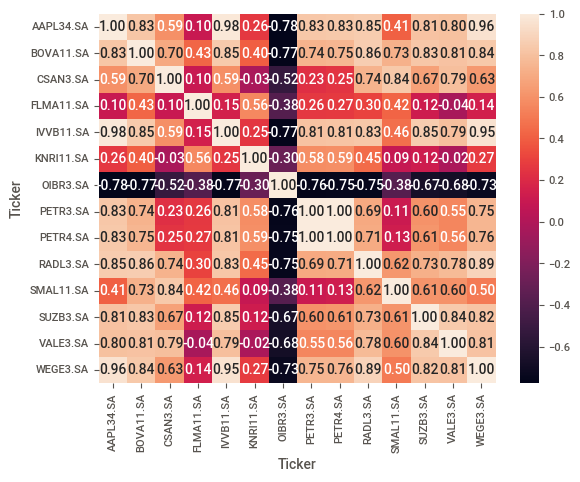

In [495]:
sns.heatmap(dados_ativos.corr(method='pearson'), annot=True, fmt=".2f");

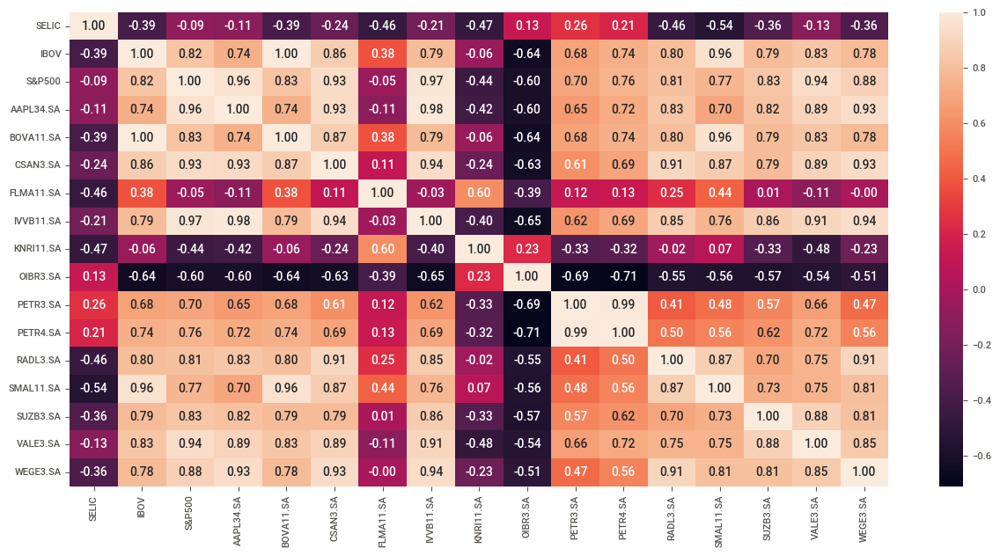

In [496]:
fig, ax = plt.subplots(figsize=(15, 7))

sns.heatmap(total_corr.corr(method='pearson'), annot=True, fmt=".2f");

##### **6.11. Correlação parcial**

**Contexto:**<p>

Dentre os muitos mitos no Mercado Financeiro, um deles muitas vezes direciona muitos investidores brasileiros: a potencial relação entre o IBOV, o Dólar e o S&P 500 (índice composto por quinhentos ativos (ações) cotados nas bolsas de NYSE ou NASDAQ).<p>
Se perguntar à maioria dos investidores, espera-se uma forte relação negativa entre IBOV e Dólar, enquanto que uma forte relação positiva entre IBOV e S&P 500.<p>
Por um lado, essas relações fazem muito sentido por diversos motivos, dentre eles:
1. Boa parte do capital estrangeiro que entra no Brasil vem na forma de dólar. Assim, os investidores estrangeiros compram real, aumentando a demanda por nossa moeda, o que consequentemente reduz a razão entre USD / BRL.
2. A compra de dólar é globalmente associada à "segurança" em períodos de crise ou instabilidade. Assim, muitos investidores vendem suas ações (reduzindo o IBOV) e compram dólar
3. O S&P 500 é um dos  das bolsas mais fortes de todo o mundo. Para muitos investidores, ela é um termômetro da economia. Se ela vai bem, pode ser um bom sinalizador de que no geral, a economia global está aquecida, aumentando os aportes também em outros países.


[Clique aqui para acessar a seção de importação e instalação de bibliotecas](#importar)

In [497]:
lista_ativos = ['^BVSP', '^GSPC', 'BRL=X']

dados_ibov_sp500 = yf.download(lista_ativos, start='2007-02-01', end='2022-01-01')['Close']

[*********************100%***********************]  3 of 3 completed


In [498]:
dados_ibov_sp500.head()

Ticker,BRL=X,^BVSP,^GSPC
Date,,,
2007-02-01,2.1032,44815.0,1445.939941
2007-02-02,2.0925,44998.0,1448.390015
2007-02-05,2.0897,45286.0,1446.989990
2007-02-06,2.0825,45352.0,1448.000000
2007-02-07,2.0820,44588.0,1450.020020


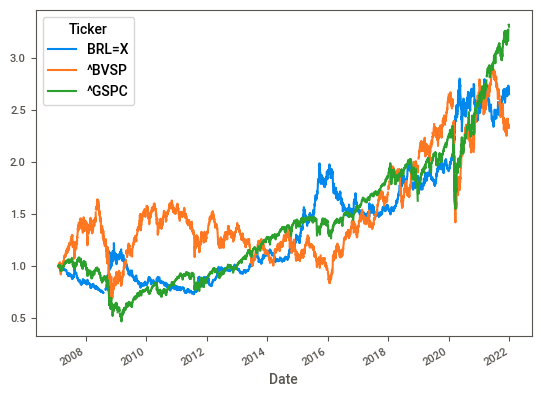

In [499]:
(dados_ibov_sp500/dados_ibov_sp500.iloc[0]).plot();

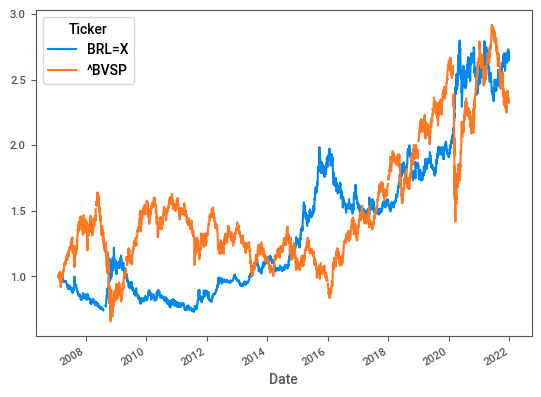

In [500]:
(dados_ibov_sp500.iloc[:,:2]/dados_ibov_sp500.iloc[0,:2]).plot();

In [501]:
dados_ibov_sp500 = dados_ibov_sp500.dropna()

In [502]:
dados_filtrados = dados_ibov_sp500[dados_ibov_sp500.index < '2018']

In [503]:
corr, p = stats.pearsonr(dados_filtrados['^BVSP'], dados_filtrados['BRL=X'])
print('Correlação de Pearson, r=%.3f' %corr, 'p=%.3f' %p)

Correlação de Pearson, r=-0.271 p=0.000


In [504]:
from pingouin import partial_corr

partial_corr(data=dados_filtrados, x= 'BRL=X', y='^BVSP', covar=['^GSPC'], method='pearson')

,n,r,CI95%,p-val
pearson,2603,-0.574179,"[-0.6, -0.55]",3.986885e-228


<Axes: xlabel='Date'>

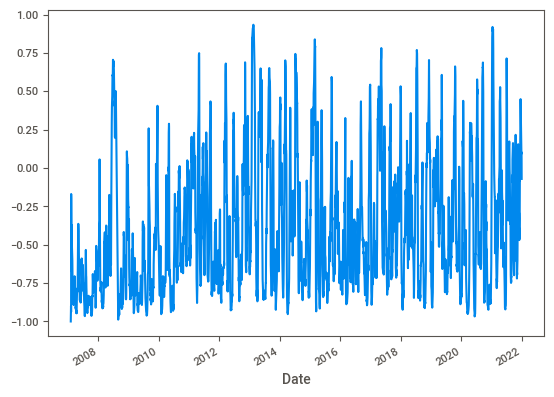

In [505]:
dados_ibov_sp500['^BVSP'].rolling('30D').corr(dados_ibov_sp500['BRL=X']).plot()

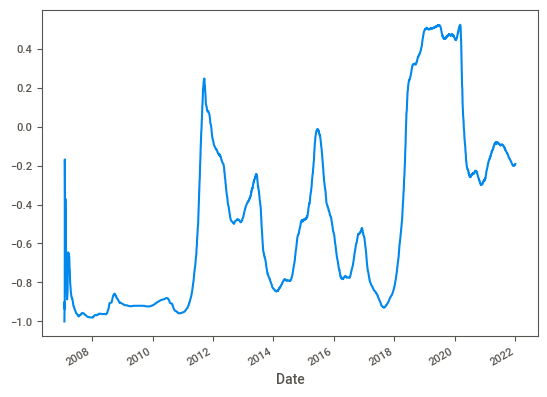

In [506]:
dados_ibov_sp500['^BVSP'].rolling('730D').corr(dados_ibov_sp500['BRL=X'], pairwise = True).plot();

##### **6.12. Referências para aprender mais**


https://algotrading101.com/learn/python-correlation-guide/m


https://www.probabilitycourse.com/chapter5/5_3_1_covariance_correlation.php#:~:text=The%20covariance%20between%20X%20and%20Y%20is%20defined%20as%20Cov,X)(EY).

https://smartasset.com/investing/stock-correlation#:~:text=Stock%20correlation%20describes%20the%20relationship,as%20bonds%20or%20real%20estate.

https://anovabr.github.io/mqt/correla%C3%A7%C3%A3o.html

Leia mais sobre Mutual Information (MI)

Essa métrica permite descobrir relações não-lineares entre as variáveis, por ex, a que é mostrada à esquerda da imagem.









<center><img src = "https://media.licdn.com/dms/image/C4E10AQFPjBwnKQdABw/image-shrink_800/0/1678440608144?e=1679526000&v=beta&t=oJgLBVpUU6-hap3UhPZxCJKvp7OXcMKsWFhKU5nWNCM" width = "400">

https://scikit-learn.org/stable/modules/generated/sklearn.feature_selection.mutual_info_regression.html#r37d39d7589e2-3

## **7. Regressão**




#### **7.1. Conceitos iniciais**

Primeiramente, o que é 'regressão'?

O termo "Regressão" representa uma série de métodos estatísticos que nós utilizamos para medir a relação entre variáveis. 

Temos uma variável dependente (nossa 'target') e uma ou mais independentes (preditoras)

Análise de regressão: a coleção de ferramentas estatísticas que são usadas para modelar e explorar relações entre variáveis que são relacionadas de maneira não-determinística.

Quais são os tipos de regressão?

Há 3 principais variações de regressão:
* Regressão linear simples
* Regressão linear múltipla
* Regressão não-linear

No entanto, na maioria do tempo nós usaremos as regressões lineares.

Os modelos não-lineares são úteis quando trabalhamos com dados mais complexos, onde as variáveis possuem uma influência não-linear sobre as outras.

Se antes ao estudar correlação nós não estávamos interessados em relações de causalidade (variáveis independentes), aqui, nós começamos a explorar essa possibilidade (variáveis dependentes e independentes).

Nesta aula, nós vamos nos debruçar sobre a regressão linear e suas aplicações no mercado financeiro

Um exemplo de utilização de regressão linear no mercado financeiro é o modelo CAPM.

<center><img src = "https://www.investopedia.com/thmb/nM4YLmelnnoslrkTjVByogAuGqU=/750x0/filters:no_upscale():max_bytes(150000):strip_icc():format(webp)/CapitalAssetPricingModelCAPM1_2-e6be6eb7968d4719872fe0bcdc9b8685.png" width = "500">

#### **7.2. Regressão Linear**

A regressão linear é um algoritmo que fornece uma relação linear entre uma variável independente e outra dependente, para prever o resultado futuro de eventos. 

É um modelo muito comum em estatística e data science para análise preditiva.

A variável independente é também o preditor ou variável explanatória que permanece imutável devido a mudança em outras variáveis.

No entanto, a variável dependente muda com as flutuações na variável independente. O modelo de regressão prevê o valor da variável dependente, que é a variável de resposta ou resultado sendo analisada ou estudada.


**Adiantando conhecimento:**

Mais pra frente, vamos entrar nos modelos de machine learning.

A regressão também se encaixa no mundo dos modelos de machine learning. Neste caso, ela se trata de um modelo de aprendizado supervisionado que simula uma relação matemática entre as variáveis para realizar predições de variáveis numéricas, como preços, retornos, salários, idades, etc.


<center><img src = "https://images.spiceworks.com/wp-content/uploads/2022/04/07040338/25-4.png" width = "500">



Situações do mercado financeiro

Este método é vantajoso quando pelo menos duas variáveis estão disponíveis nos dados, como observado em previsões do mercado financeiro, portfolio management, análise científica, etc

Exemplo:

No modelo CAPM citado anteriormente, a regressão linear simples é parte fundamental do seu cálculo.

O CAPM nos mostra a relação entre o risco sistemático de um investimento e o retorno esperado para ele.

Assim, seu objetivo é analisar se um investimento está avaliado de forma justa através da comparação do risco e valor no tempo com o retorno esperado.

Analistas utilizam este modelo para tentar prever retornos e a performance operacional da empresa.

A regressão é utilizada para calcular o coeficiente **beta** da ação. O beta mostra a volatilidade dos retornos relativa ao risco geral do mercado.

#### **7.3. Equacionamento**

Busca-se construir uma equação preditiva, com inclinaçao da reta e intercepto (cruza eixo y)

<img src="https://www.investopedia.com/thmb/00slg02wynhMgnRGGg8yhEYTNSA=/1500x0/filters:no_upscale():max_bytes(150000):strip_icc()/LeastSquaresMethod-4eec23c588ce45ec9a771f1ce3abaf7f.jpg" width="400" align="center"/>

##### E o que o OLS produz?

<img src="https://miro.medium.com/max/700/1*9zLEB40a6b8kjtpkMBbkmw.png" width="500" align="left"/>

<img src="https://miro.medium.com/max/700/1*GSAcN9G7stUJQbuOhu0HEg.png" width="500" align="left"/>


A equação que você vê acima procura encontrar o melhor ajuste (fit) de um conjunto de observações (nossa amostra de dados) das variáveis dependentes e independentes. O objetivo é estimar a relação subjacente entre estas variáveis de forma que consigamos prever o resultado da variável "target" com base nas outras (preditores) 

Observe o gráfico acima. Nele, $\beta$0 é a interseção (intercept) e o $\beta$1 é a inclinação (coeficiente). Ela nos mostra a medida da mudança na variável dependente (target) devido a uma mudança noas outras variáveis.

Desta forma, nós podemos avaliar as variáveis que afetam uma determinada métrica, como por exemplo preços ou retornos no mercado financeiro.

**De onde vem o conhecimento dos componentes da equação?**

Apresentando o "Ordinary Least Squares (OLS)" ou Mínimos Quadrados Ordinários

É o nome do método utilizado para calcular os coeficientes de uma regressão linear.

O objetivo aqui é encontrar uma reta tal que se ajusta a um conjunto de pares de observações, das variáveis dependentes e independentes.

A linha com o melhor "fit" é onde a soma dos quadrados dos desvios verticais (distâncias) entre os pontos de obsevação e a linha é mínimo. Ou seja, a soma dos quadrados dos erros (SQE) seja a menor possível.

Com o método OLS, nós obtemos os coeficientes da regressão - a interseção e inclinação da nossa reta.

<img src="https://miro.medium.com/v2/resize:fit:500/0*gglavDlTUWKn4Loe" width="400" align="center"/>

Para saber mais: https://medium.com/analytics-vidhya/ordinary-least-square-ols-method-for-linear-regression-ef8ca10aadfc

#### **7.4. Obtenção de dados**

Vamos criar um modelo de regressão para tentar prever o resultado de um dia com base no gap de abertura

[Clique aqui para acessar a seção de importação e instalação de bibliotecas](#importar)

In [507]:
oc_vale3 = yf.download('VALE3.SA', start='2010-01-01', end = '2023-03-25', multi_level_index=False)[['Open', 'Close']]

[*********************100%***********************]  1 of 1 completed


In [508]:
oc_vale3['Resultado'] = oc_vale3.Close.pct_change()*100

In [509]:
oc_vale3.head()

,Open,Close,Resultado
Date,,,
2010-01-04,22.386911,22.966768,NaN
2010-01-05,22.989068,23.180866,0.932208
2010-01-06,23.194245,23.671511,2.116592
2010-01-07,23.421731,23.769646,0.414570
2010-01-08,23.774108,24.001591,0.975804


In [510]:
oc_vale3['Close_anterior'] = oc_vale3.Close.shift(1)
oc_vale3.head()

,Open,Close,Resultado,Close_anterior
Date,,,,
2010-01-04,22.386911,22.966768,NaN,NaN
2010-01-05,22.989068,23.180866,0.932208,22.966768
2010-01-06,23.194245,23.671511,2.116592,23.180866
2010-01-07,23.421731,23.769646,0.414570,23.671511
2010-01-08,23.774108,24.001591,0.975804,23.769646


Agora vamos calcular o GAP de abertura

GAP de abertura: Variação percentual entre o fechamento do dia anterior e a abertura do dia atual

In [511]:
oc_vale3['Gap_abertura'] = (oc_vale3.Open - oc_vale3.Close_anterior)/oc_vale3.Close_anterior*100
oc_vale3

,Open,Close,Resultado,Close_anterior,Gap_abertura
Date,,,,,
2010-01-04,22.386911,22.966768,NaN,NaN,NaN
2010-01-05,22.989068,23.180866,0.932208,22.966768,0.097094
2010-01-06,23.194245,23.671511,2.116592,23.180866,0.057713
2010-01-07,23.421731,23.769646,0.414570,23.671511,-1.055192
2010-01-08,23.774108,24.001591,0.975804,23.769646,0.018772
...,...,...,...,...,...
2023-03-20,72.772256,73.379280,0.821956,72.781052,-0.012085
2023-03-21,73.212113,72.763443,-0.839252,73.379280,-0.227812
2023-03-22,72.138840,71.857323,-1.245296,72.763443,-0.858402


In [512]:
oc_vale3.dropna(inplace=True)

#### **7.5. Visualização de dados**

In [513]:
fig = px.scatter(oc_vale3, x='Gap_abertura', y='Resultado', template='simple_white', width=400, height=400)
fig.show()

Vamos remover da visualização os outliers

In [514]:
vale_sem_outliers = oc_vale3[(oc_vale3.Gap_abertura>=-17) & (oc_vale3.Gap_abertura<=18)]
fig = px.scatter(vale_sem_outliers, x='Gap_abertura', y='Resultado', template='simple_white', width=400, height=400)
fig.show()

#### **7.6. Criação do modelo de regressão linear**

In [515]:
stats.linregress(vale_sem_outliers.Gap_abertura, vale_sem_outliers.Resultado)

LinregressResult(slope=1.0205042483836804, intercept=-0.06768478030133135, rvalue=0.5854494935384844, pvalue=4.321183988901166e-301, stderr=0.024682312047762684, intercept_stderr=0.036099372898107135)

In [516]:
slope, intercept, r, p, std_err = stats.linregress(vale_sem_outliers.Gap_abertura, vale_sem_outliers.Resultado)

In [517]:
slope

1.0205042483836804

In [518]:
intercept

-0.06768478030133135

In [519]:
r

0.5854494935384844

In [520]:
r**2

0.3427511094844679

In [521]:
p

4.321183988901166e-301

Interpretando os resultados

P-valor

O p-valor nos ajuda a entender a relação das variáveis no nosso modelo. Ele avalia a hipótese nula de que não há relação entre as variáveis.


R-quadrado

Mostra a qualidade do fit. Varia entre 0 e 1, sendo 0 um modelo que não consegue capturar a relação entre as variáveis e 1 um ajuste perfeito. Se a nossa regressão mostra um valor de R-quadrado de 0.6, nós conseguimos explicar 60% da variabilidade da variável dependente  com o modelo de regressão.

Com o p-valor obtido, nós rejeitamos a hipótese de que não há relação entre essas variáveis.

##### **Outra forma de executar a regressão**

In [522]:
X = sm.add_constant(vale_sem_outliers.Gap_abertura)

Vamos estimar o Ordinary Least Squares para estas variáveis

In [523]:
est = sm.OLS(vale_sem_outliers.Resultado, X)

In [524]:
est

In [525]:
est2 = est.fit()

In [526]:
est2

In [527]:
print(est2.summary())

                            OLS Regression Results                            
Dep. Variable:              Resultado   R-squared:                       0.343
Model:                            OLS   Adj. R-squared:                  0.343
Method:                 Least Squares   F-statistic:                     1709.
Date:                Tue, 28 Jan 2025   Prob (F-statistic):          4.32e-301
Time:                        15:41:19   Log-Likelihood:                -7021.7
No. Observations:                3280   AIC:                         1.405e+04
Df Residuals:                    3278   BIC:                         1.406e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const           -0.0677      0.036     -1.875   

#### **7.7. Regressão múltipla: aumentando o número de preditores**

In [528]:
vale_sem_outliers.head()

,Open,Close,Resultado,Close_anterior,Gap_abertura
Date,,,,,
2010-01-05,22.989068,23.180866,0.932208,22.966768,0.097094
2010-01-06,23.194245,23.671511,2.116592,23.180866,0.057713
2010-01-07,23.421731,23.769646,0.414570,23.671511,-1.055192
2010-01-08,23.774108,24.001591,0.975804,23.769646,0.018772
2010-01-11,24.353955,23.930216,-0.297376,24.001591,1.468089


In [529]:
vale_sem_outliers['Resultado_dia_anterior'] = vale_sem_outliers.Resultado.shift(1)
vale_sem_outliers.head()

,Open,Close,Resultado,Close_anterior,Gap_abertura,Resultado_dia_anterior
Date,,,,,,
2010-01-05,22.989068,23.180866,0.932208,22.966768,0.097094,NaN
2010-01-06,23.194245,23.671511,2.116592,23.180866,0.057713,0.932208
2010-01-07,23.421731,23.769646,0.414570,23.671511,-1.055192,2.116592
2010-01-08,23.774108,24.001591,0.975804,23.769646,0.018772,0.414570
2010-01-11,24.353955,23.930216,-0.297376,24.001591,1.468089,0.975804


In [530]:
vale_sem_outliers.dropna(inplace=True)

In [531]:
preditores =  vale_sem_outliers[['Gap_abertura', 'Resultado_dia_anterior']]

In [532]:
X2 = sm.add_constant(preditores)

In [533]:
est = sm.OLS(vale_sem_outliers.Resultado, X2)

In [534]:
est

In [535]:
est2 = est.fit()

In [536]:
print(est2.summary())

                            OLS Regression Results                            
Dep. Variable:              Resultado   R-squared:                       0.343
Model:                            OLS   Adj. R-squared:                  0.342
Method:                 Least Squares   F-statistic:                     854.3
Date:                Tue, 28 Jan 2025   Prob (F-statistic):          2.58e-299
Time:                        15:41:20   Log-Likelihood:                -7020.0
No. Observations:                3279   AIC:                         1.405e+04
Df Residuals:                    3276   BIC:                         1.406e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                     -0

In [537]:
fig = px.scatter(vale_sem_outliers, x='Resultado_dia_anterior', y='Resultado', template='simple_white', width=400, height=400)
fig.show()

Para aprender mais

* https://medium.com/magnimetrics/regression-analysis-in-financial-modeling-225425f544b9#:~:text=The%20linear%20regression%20model%20is,operational%20performance%20of%20the%20business.